# 1b. EEG Feature Extraction

## Run

- 1b EEG Feature Extraction [Jump To](#run-1b-eeg-feature-extraction)


## Some Ref Links

- The Brain Imaging Data Structure (BIDS): https://bids.neuroimaging.io
- MNE-Python: https://mne.tools/stable/index.html
- SpecParam: https://specparam-tools.github.io and https://github.com/fooof-tools

## Dependencies

General dependencies:
- python = 3.11.13
- numpy = 2.0.2
- scipy = 1.15.3
- pandas = 2.2.3
- matplotlib = 3.10.3

ML dependencies:
- scikit-learn = 1.6.1

EEG specific dependencies:
- mne = 1.9.0
- mne-icalabel = 0.7.0
- autoreject = 0.4.3
- specparam = 2.0.0rc3

# Imports & Utilities

In [1]:
# General imports
import os
import sys
import gc
import warnings

from datetime import datetime
from pprint import pprint
import time
import pickle
import random
from collections import Counter

# Custom Functions
sys.path.append(os.path.abspath('../Notebooks/Utilities')) 
import cust_utilities as utils

# Maths, Pandas etc
import math
import numpy as np
import pandas as pd
import scipy as sci

# Plots
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.backends.backend_pdf import PdfPages

# MNE-Python
import mne
from mne.preprocessing import ICA
from mne_icalabel import label_components
from autoreject import AutoReject
from autoreject import get_rejection_threshold

# SpecParam
from specparam import SpectralGroupModel
from specparam.plts.spectra import plot_spectra
# from specparam import __version__ as specparam_version
# print('Current SpecParam version:', specparam_version)


# Functions

In [2]:
# Function to plot EEG Time Series & Save to PDF
#

def plot_EEG_TD(eeg_FIF, channels, time_range_s=[], pdf_file = None):
    
    """
    EEG Time Domain Plot.

    Parameters
    ----------
    eeg_FIF : FIF
    channels : [str] eg ['P5', 'Pz']
    time_range_s : [nn,nn]
    """

    # Channels Limit
    max_plots = 5
    if len(channels) > max_plots:
        channels = channels[:max_plots]

    # Time Range
    sfreq = eeg_FIF.info['sfreq']
    if time_range_s:
        start = int(time_range_s[0] * sfreq)
        stop = int(time_range_s[1] * sfreq)
    else:
        start = 0
        stop = None

    # Get signal and times for the elected channel(s)
    # Handle Epoched data
    if eeg_FIF.__class__.__name__.startswith('Raw'):
        signal, times = eeg_FIF.get_data(picks=channels, 
                                        start=start, stop=stop,
                                        return_times=True)
    else:
        # warnings.warn("Epoched data detected: plotting may not be accurate for all types.", UserWarning)
        # return
        signal = eeg_FIF.get_data(picks=channels)  # shape: (n_epochs, n_channels, n_times)
        signal = signal.mean(axis=0)  # shape: (n_channels, n_times)
        times = eeg_FIF.times  # shape: (n_times,)

    # plot and copy to pdf
    plt.figure(figsize=(12, 8))
    for i, ch_name in enumerate(channels):
        plt.plot(times, signal[i] * 1e6, label=ch_name, alpha=0.7, linewidth=0.6)
    plt.title('EEG Time Series - Channels: ' + ', '.join(channels))
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude (µV)')
    plt.legend()
    plt.tight_layout()
    if pdf_file:
        pdf_file.savefig()
    plt.show()

In [3]:
# Function to plot EEG Frequency Domain / PSD
#

def plot_EEG_PSD(spectra, channel):
    """
    EEG Frequency Domain / PSD Plot.

    Parameters
    ----------
    spectra : mne.Spectrum
    channel : str eg 'P5'
    """

    freqs = spectra.freqs
    powers = spectra.get_data(return_freqs=False)

    # Average power across all epochs for each channel
    if powers.ndim == 3:  # shape: (n_epochs, n_channels, n_freqs)
        powers = powers.mean(axis=0)  # shape: (n_channels, n_freqs)

    # print('Quick PSD')
    # spectra.plot()
    # plt.show()

    # Log-log plot for all channels
    plt.figure(figsize=(12, 6))
    for idx, ch in enumerate(spectra.ch_names):
        plt.loglog(freqs, powers[idx], alpha=0.5, label=ch if idx < 10 else None)  # label only first 10 for clarity
    plt.title(f"Power Spectrum (Log-Log) - All Channels ({spectra.method} method)")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power ($V^2/Hz$)")
    plt.tight_layout()
    plt.show()

    # Log-lin plot for all channels
    plt.figure(figsize=(12, 6))
    for idx, ch in enumerate(spectra.ch_names):
         plt.semilogy(freqs, powers[idx], alpha=0.5, label=ch if idx < 10 else None)  # label only first 10 for clarity
    plt.title(f"Power Spectrum (Log-Lin) - All Channels ({spectra.method} method)")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power ($V^2/Hz$)")
    plt.tight_layout()
    plt.show()

    # A selected channel
    ch_label = channel
    fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
    fig.suptitle(f'Power Spectrum - Channel {ch_label} ({spectra.method} method)', fontsize=20)
    ax0.set_title('Log/Log')
    ax1.set_title('Log/Lin')
    plot_spectra(freqs, powers[spectra.ch_names.index(ch_label)], log_freqs=True, log_powers=True, ax=ax0, colors='blue')
    plot_spectra(freqs, powers[spectra.ch_names.index(ch_label)], log_powers=True, ax=ax1, colors='blue')
    plt.show()


In [4]:
# Function to inspect quality of a SpecParam Group fit
#

def inspect_spm_group(fg, error_threshold = 0.05, r2_threshold = 0.1):

    fit_warning = False
    flagged_channels = []

    # Check Null Fits
    if fg.n_null_ > 0:
        fit_warning = True

    # Check the Mean Error & R^2
    error_mean = np.mean(fg.get_params('error'))
    r_squared_mean = np.mean(fg.get_params('r_squared'))
    if (error_mean > error_threshold) or (r_squared_mean < r2_threshold):
        fit_warning = True

    # TODO: Is this check too time consuming!?
    # Capture the worst channels
    flagged_channels = [ind for ind, res in enumerate(fg) if res.error > error_threshold]
    if len(flagged_channels) > 0:
        fit_warning = True
    
    group_summary = pd.Series({
        'SPM_fit_quality_warning': fit_warning,
        'spectra_count': len(fg),
        'null_fits': fg.n_null_,
        'error_mean': error_mean,
        'r2_mean': r_squared_mean,
        'flagged_channels': flagged_channels,
        'peaks_count_max': np.max(fg.n_peaks_),
        'peaks_count_mean': np.mean(fg.n_peaks_)
        })
    
    return group_summary


In [5]:
# Function to plot a SpecParam Fit
#

def plot_spm_fit(fm, channel_name):

    print(f'SpecParam for Channel: {channel_name}')
    fm.print_results()

    freqs = fm.freqs
    flattened_data = fm.get_model(component='peak', space='log')

    # Three plots
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
    fig.suptitle(f'SpecParam Fit for Channel: {channel_name}', fontsize=20)
    axes[0].set_title('Fit + Peaks')
    fm.plot(plot_peaks='shade', peak_kwargs={'color' : 'green'}, ax=axes[0])
    axes[1].set_title('Flattened - Offset Removed')
    axes[1].plot(freqs, flattened_data)
    axes[2].set_title('Log/Log + Peaks')
    fm.plot(plot_peaks='shade', peak_kwargs={'color' : 'green'}, plt_log=True, ax=axes[2])
    plt.show()
    

In [6]:
# # Function to plot SpecParam Results
# #

# def plot_SpecParam(fg, channel_indx, channel_name):
#     """
#     EEG SpecParam Results Plot

#     Parameters
#     ----------
#     fg : SpecParamGroupModel
#     """
#     fm = fg.get_model(ind=channel_indx, regenerate=True)

#     print(f'SpecParam for Channel: {channel_name}')
#     fm.print_results()

#     # fm.plot()
#     fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize=(12, 8))
#     fig.suptitle(f'Spec Param for Channel: {channel_name}', fontsize=20)
#     ax0.set_title('Components - Log/Lin')
#     ax1.set_title('Components - Log/Log')
#     fm.plot(plot_peaks='shade', peak_kwargs={'color' : 'green'}, ax=ax0)
#     fm.plot(plot_peaks='shade', peak_kwargs={'color' : 'green'}, plt_log=True, ax=ax1)
#     plt.show()


In [7]:
# Test Bands

from specparam import Bands
from specparam.data.periodic import get_band_peak, get_band_peak_group

bands = Bands({'Delta': [0.5, 4],
               'Theta': [4, 8],
               'Alpha': [8, 13],
               'Beta': [13, 30],
               'Gamma': [30, 100]
               })

def test_get_bands(fm, channel_name):
    
    all_bands = []
    for band_label in bands.labels:
        band_range = bands[band_label]
        peak_details = (band_label, get_band_peak(fm, band_range, select_highest=False))
        all_bands.append(peak_details)

    print(f'For Channel: {channel_name} Bands: \n{all_bands}')


# Run: 1b EEG Feature Extraction

In [8]:
# Run Details & Parameters
#

# Study Details
study_name = 'IOWA_Rest'

# Get existing study details, if exists
study_folder_path = utils.get_folder_path('Study_' + study_name)
study_info = pd.read_pickle(study_folder_path + '/study_inf.pkl', compression='zip')
study_subjects_df = pd.read_pickle(study_folder_path + '/study_subjects_df.pkl', compression='zip')

# Run Name, Data Source & Test Mode
run_description = 'features_test'
data_source = '1a_EEG_Preprocessing_Results_20250702_full_run'
test_mode = True

# Preprocessing Parameters for this run
psd_params = {'method': 'welch', #welch or multitaper (often used for epoched data)
              'fmin': 1, 'fmax': 100,       
              'exclude': []  # Includes all, even bad channels
              }
specparam_params = {'peak_width_limits': [1, 12],
                    'max_n_peaks': 10,
                    'min_peak_height': 0.1,
                    'peak_threshold': 2.0,
                    'aperiodic_mode': 'fixed',
                    'fit_window' : [1, 100],
                    'fit_error_threshold': 0.1,
                    'fit_r2_threshold': 0.9
                     }

# Setup the processing run and results folder & save params
source_data_path = utils.get_folder_path(study_info['eeg_processing_results_path'] + '/' + data_source + '/EEG_2_cleaned_files' )
current_date = datetime.now().strftime('%Y%m%d')
run_name = f'1b_EEG_Features_Results_{current_date}_{run_description}'
run_results_path = utils.extend_folder_path(study_info['eeg_processing_results_path'], run_name, exists_ok=False)

run_details = pd.Series({
    'run_name': run_name,
    'study_name': study_name,
    'data_source': source_data_path,
    'psd_params': psd_params,
    'specparam_params': specparam_params,
})
run_details.to_pickle(run_results_path + '/run_details.pkl', compression='zip')

# Create empty study results
eeg_results_superset_df = pd.DataFrame()

# Set progress messages, testing
if test_mode:
    VERBOSE = True
    test_subjects = [0,5,101]
    test_channels = ['F4', 'C5', 'Cz', 'P6']
else:
    VERBOSE = False
    test_subjects = []
    test_channels = []
    
del current_date, study_name, run_description, study_folder_path


EEG Feature Extraction
- Study: IOWA_Rest ds004584-1.0.0
- Run: 1b_EEG_Features_Results_20250704_features_test
- Data Source: /Users/stuartgow/GitHub/EEG_ML_Pipeline/Data/Study_IOWA_Rest/1_EEG_Processing_Results/1a_EEG_Preprocessing_Results_20250702_full_run/EEG_2_cleaned_files
- PSD Params: {'method': 'welch', 'fmin': 1, 'fmax': 100, 'exclude': []}
- SpecParam Params: {'peak_width_limits': [1, 12], 'max_n_peaks': 10, 'min_peak_height': 0.1, 'peak_threshold': 2.0, 'aperiodic_mode': 'fixed', 'fit_window': [1, 100], 'fit_error_threshold': 0.1, 'fit_r2_threshold': 0.9}

-----------------------------------------------------------------------------------------------
Subject: sub-001
---Get EEG Preprocessed Data - FIF ----------------------------------
Reading /Users/stuartgow/GitHub/EEG_ML_Pipeline/Data/Study_IOWA_Rest/1_EEG_Processing_Results/1a_EEG_Preprocessing_Results_20250702_full_run/EEG_2_cleaned_files/sub-001_preprocessed_epo.fif ...
    Found the data of interest:
        t =      

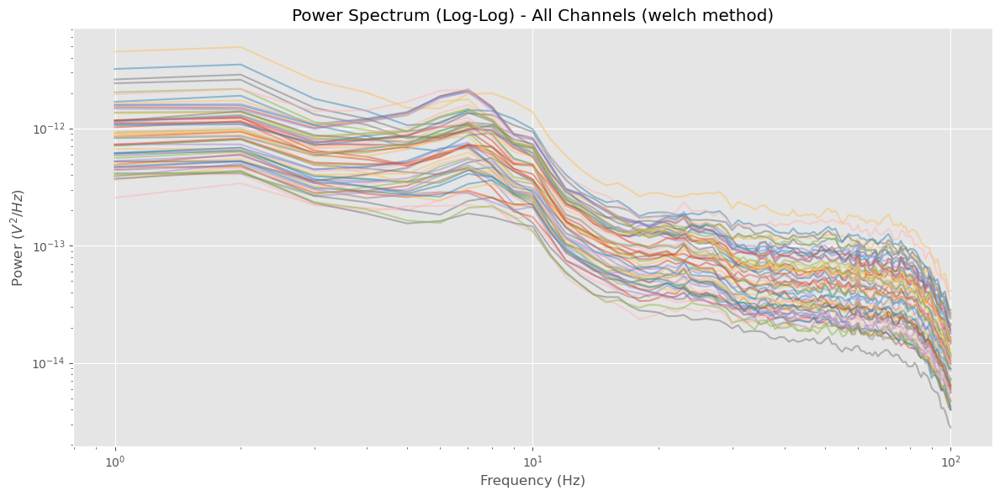

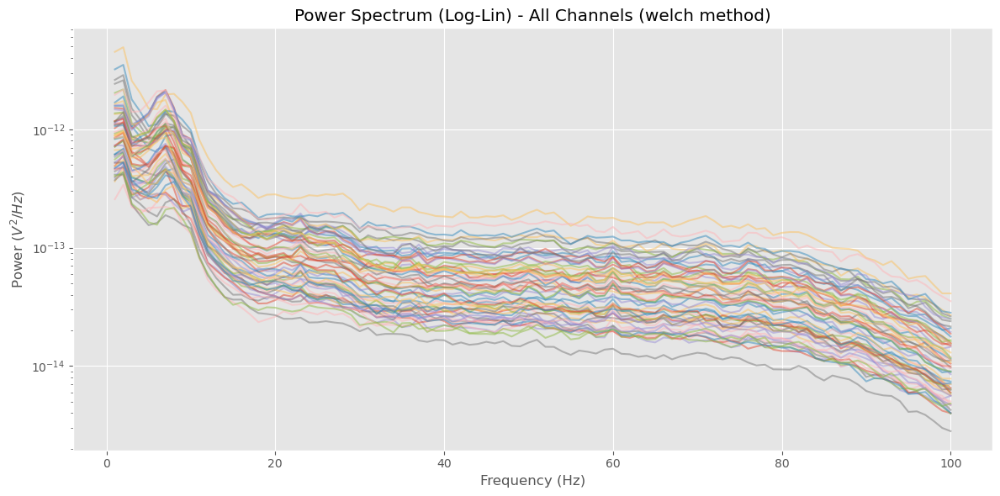

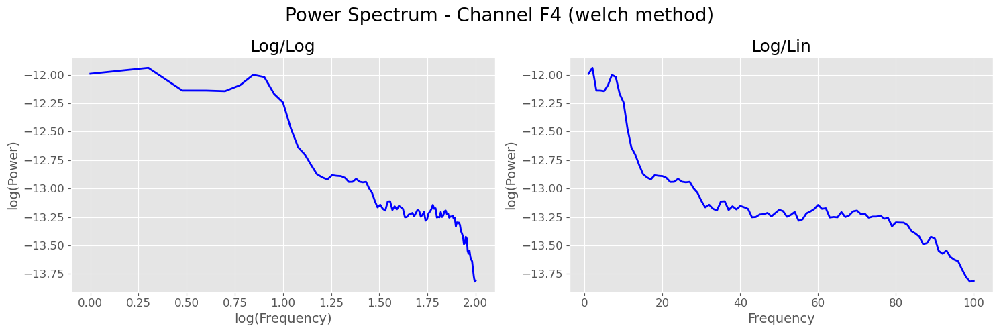

---EEG Spectral Parameterisation------------------------------------
Given: 1 & 12 and new 2.0


Running group fits.:   0%|          | 0/63 [00:00<?, ?it/s]

Group Summary: 
SPM_fit_quality_warning       False
spectra_count                    63
null_fits                         0
error_mean                 0.048021
r2_mean                    0.973359
flagged_channels                 []
peaks_count_max                   6
peaks_count_mean           3.730159
dtype: object
                                                                                                  
                                          GROUP RESULTS                                           
                                                                                                  
                             Number of power spectra in the Group: 63                             
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                        

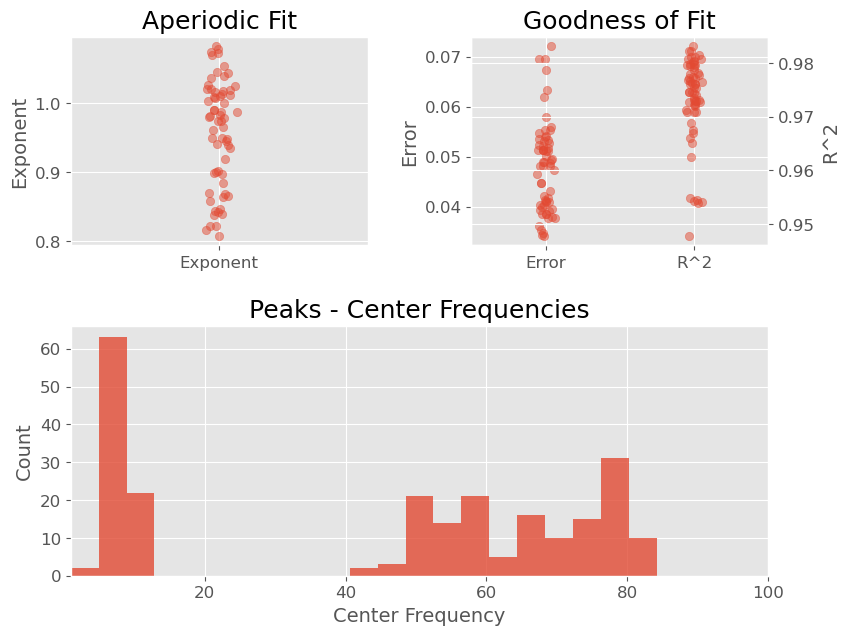

SpecParam for Channel: F4
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.7085, 0.9415                                         
                                                                                                  
                                       4 peaks were found:                         

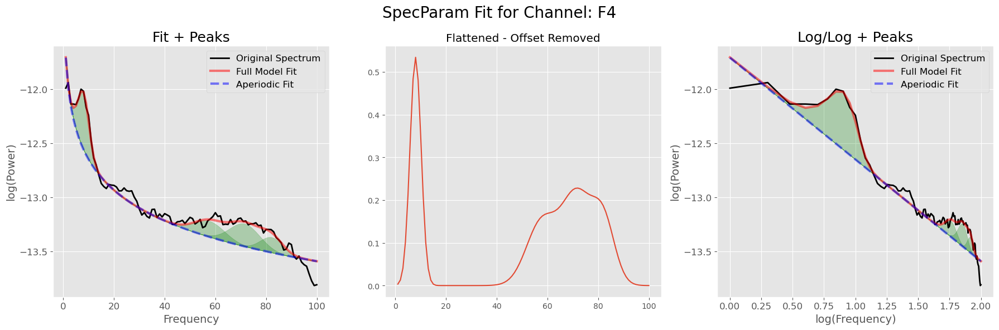

For Channel: F4 Bands: 
[('Delta', array([nan, nan, nan])), ('Theta', array([7.9860602 , 0.53402647, 4.39543728])), ('Alpha', array([nan, nan, nan])), ('Beta', array([nan, nan, nan])), ('Gamma', array([[57.65632654,  0.16273793, 11.99999982],
       [71.53754823,  0.22804429, 12.        ],
       [82.17027026,  0.18715491,  8.92592797]]))]
SpecParam for Channel: C5
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic 

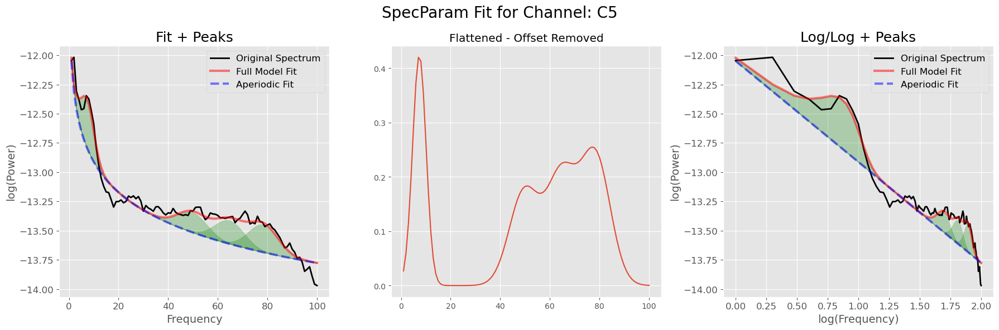

For Channel: C5 Bands: 
[('Delta', array([nan, nan, nan])), ('Theta', array([7.37450334, 0.41986875, 5.43458587])), ('Alpha', array([nan, nan, nan])), ('Beta', array([nan, nan, nan])), ('Gamma', array([[49.64883734,  0.18239388, 12.        ],
       [64.63419266,  0.22547673, 12.        ],
       [78.36642353,  0.25333175, 12.        ]]))]
SpecParam for Channel: Cz
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic 

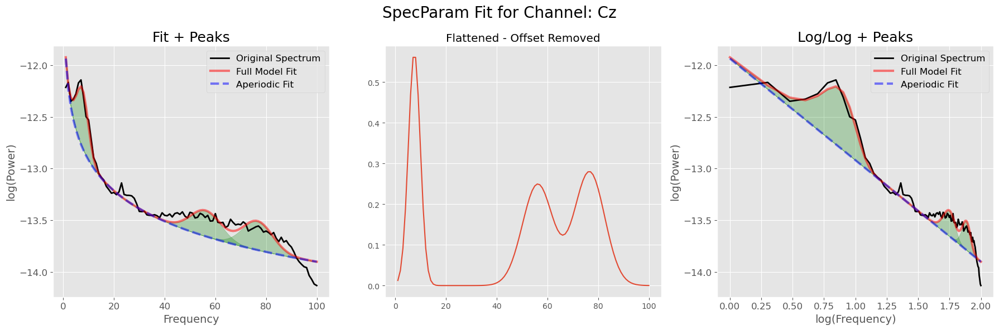

For Channel: Cz Bands: 
[('Delta', array([nan, nan, nan])), ('Theta', array([7.49894989, 0.56072975, 4.69785739])), ('Alpha', array([nan, nan, nan])), ('Beta', array([nan, nan, nan])), ('Gamma', array([[56.15875899,  0.24946433, 12.        ],
       [76.58966005,  0.27960971, 12.        ]]))]
SpecParam for Channel: P6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                  

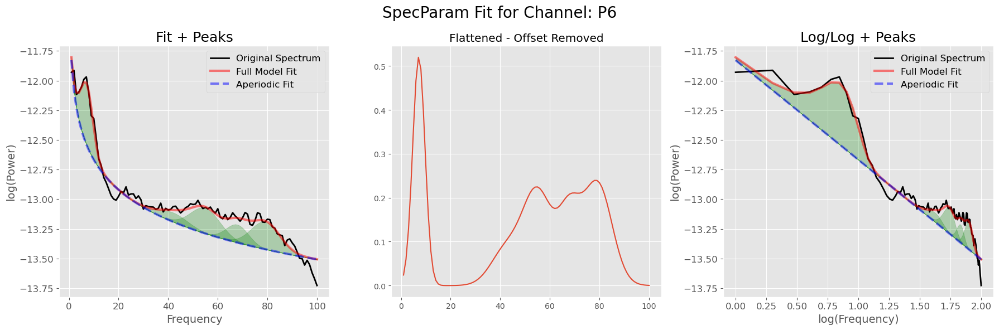

For Channel: P6 Bands: 
[('Delta', array([nan, nan, nan])), ('Theta', array([7.17535198, 0.51962834, 4.97747952])), ('Alpha', array([nan, nan, nan])), ('Beta', array([nan, nan, nan])), ('Gamma', array([[42.05489372,  0.09919258, 11.9999964 ],
       [54.9040692 ,  0.22461724, 11.99999951],
       [67.80790432,  0.20839349,  8.95847333],
       [79.19410768,  0.23931442, 11.6544898 ]]))]
---Collating Results for sub-001 ------------------------------

-----------------------------------------------------------------------------------------------
Subject: sub-006
---Get EEG Preprocessed Data - FIF ----------------------------------
Reading /Users/stuartgow/GitHub/EEG_ML_Pipeline/Data/Study_IOWA_Rest/1_EEG_Processing_Results/1a_EEG_Preprocessing_Results_20250702_full_run/EEG_2_cleaned_files/sub-006_preprocessed_epo.fif ...
    Found the data of interest:
        t =       0.00 ...     998.00 ms
        0 CTF compensation matrices available
Not setting metadata
253 matching events found
No

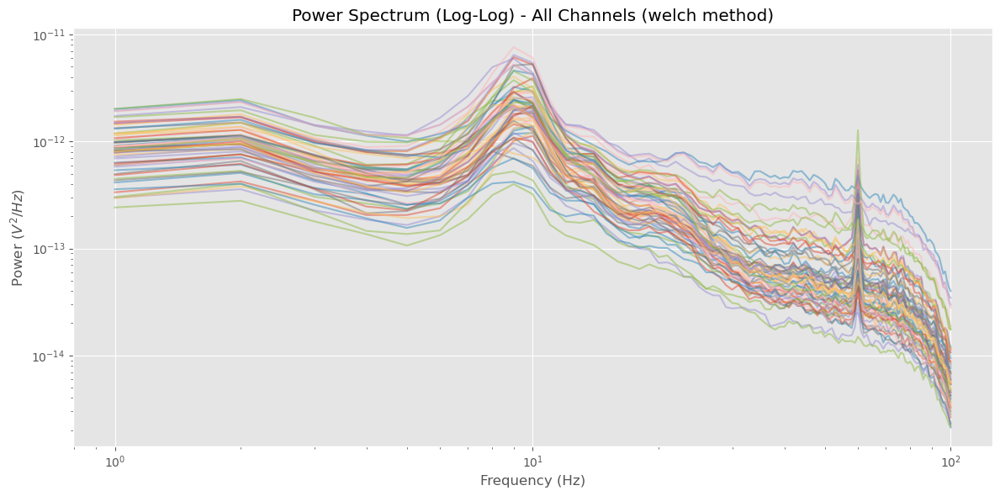

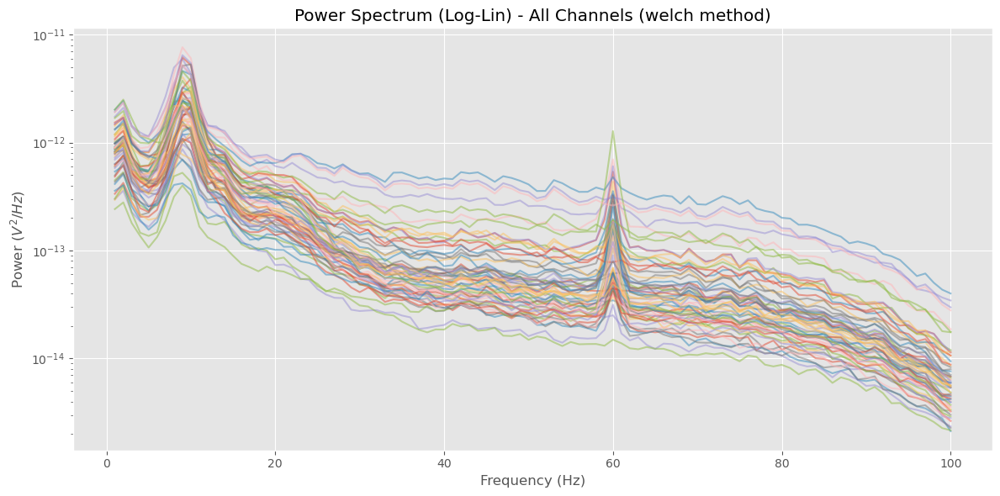

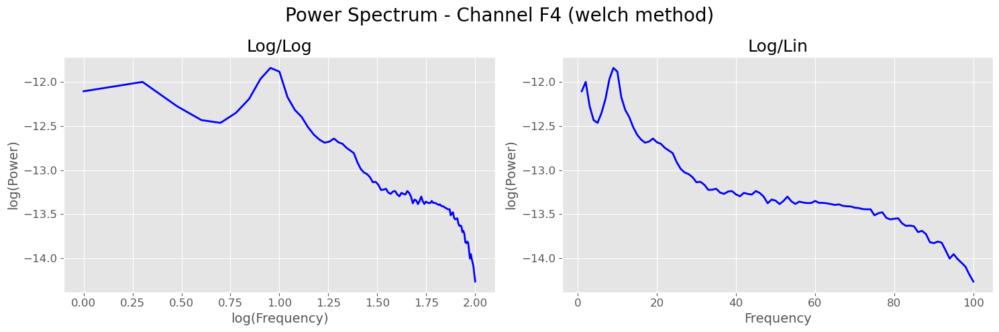

---EEG Spectral Parameterisation------------------------------------
Given: 2.0 & 12 and new 2.0


Running group fits.:   0%|          | 0/63 [00:00<?, ?it/s]

Group Summary: 
SPM_fit_quality_warning                                                 True
spectra_count                                                             63
null_fits                                                                  0
error_mean                                                          0.103979
r2_mean                                                             0.932832
flagged_channels           [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 13, 14, 17,...
peaks_count_max                                                            7
peaks_count_mean                                                    3.190476
dtype: object
                                                                                                  
                                          GROUP RESULTS                                           
                                                                                                  
                             Number of power spectra in t

/var/folders/wd/rhzj_w8570g_y66t6j6mh4zw0000gn/T/ipykernel_26827/2646068876.py:83: UserWarning: SpecParam Fit Issues
  warnings.warn(f'SpecParam Fit Issues', UserWarning)


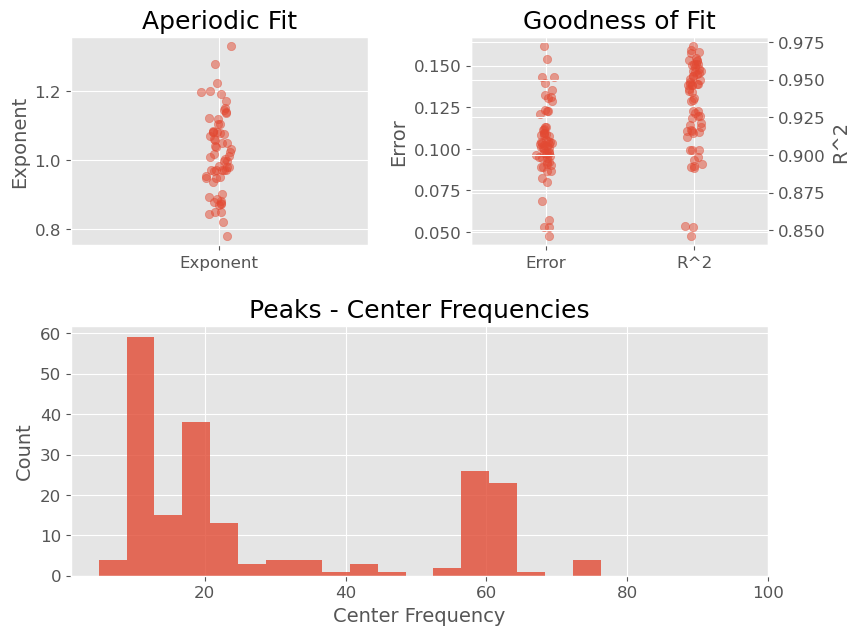

SpecParam for Channel: Fp1
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.7326, 0.9703                                         
                                                                                                  
                                       4 peaks were found:                        

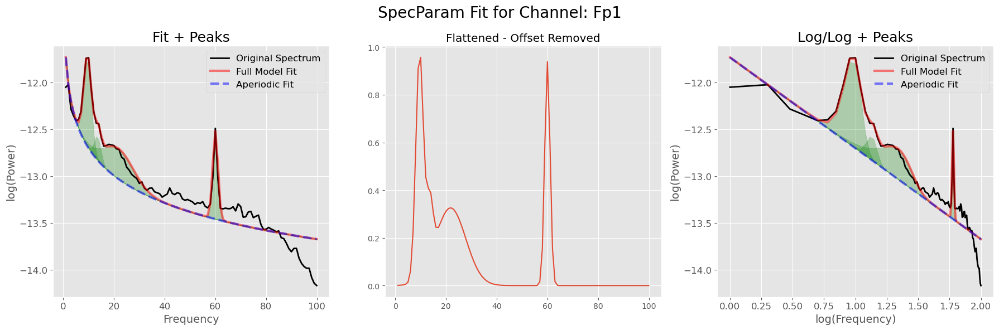

SpecParam for Channel: Fz
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.6922, 1.0690                                         
                                                                                                  
                                       2 peaks were found:                         

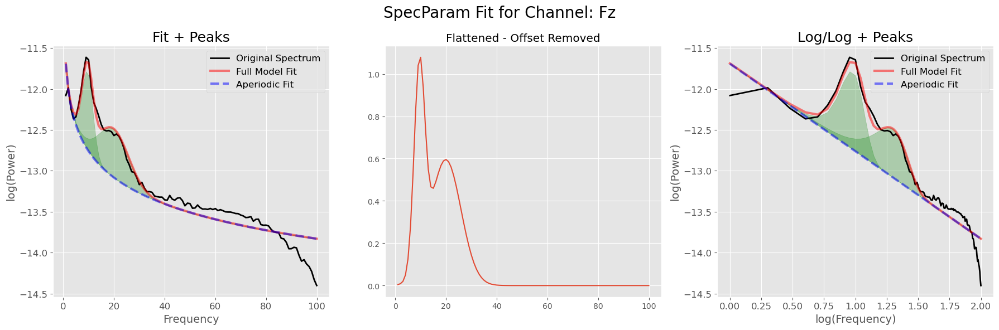

SpecParam for Channel: F3
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.6726, 1.0504                                         
                                                                                                  
                                       2 peaks were found:                         

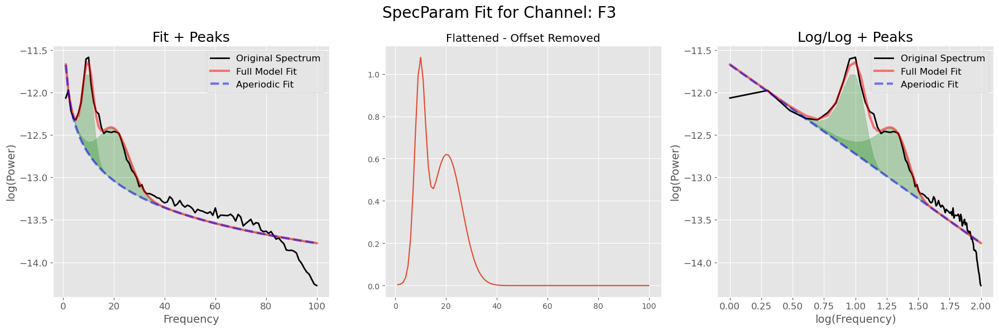

SpecParam for Channel: F7
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.6238, 1.0381                                         
                                                                                                  
                                       2 peaks were found:                         

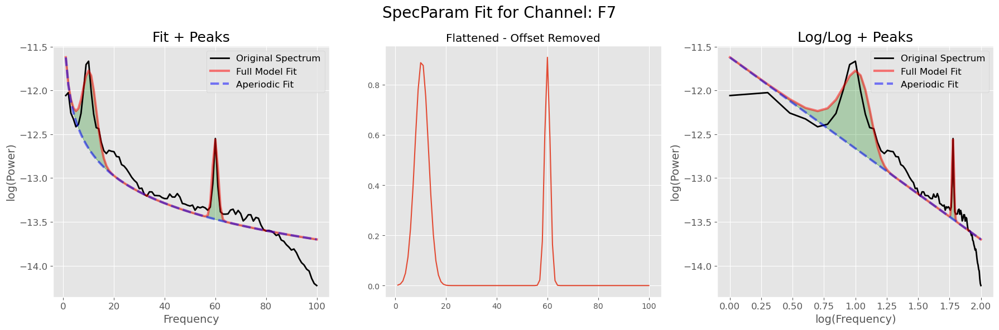

SpecParam for Channel: FT9
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.7516, 0.9708                                         
                                                                                                  
                                       2 peaks were found:                        

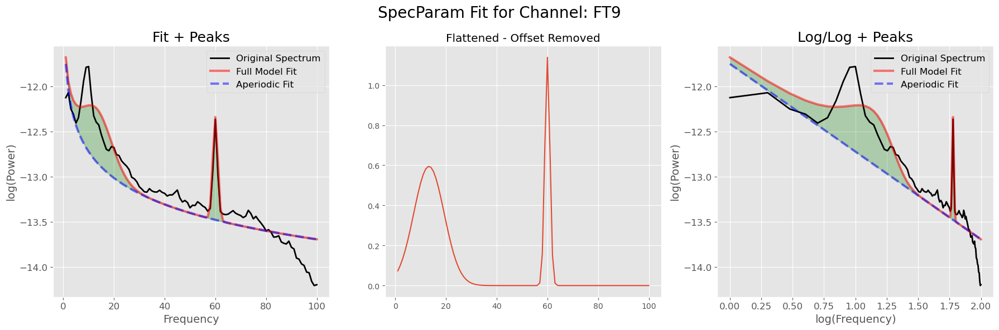

SpecParam for Channel: FC5
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.9815, 0.9823                                         
                                                                                                  
                                       3 peaks were found:                        

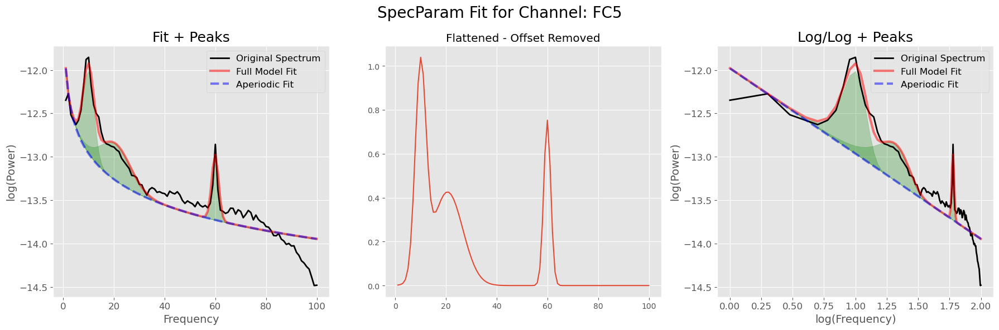

SpecParam for Channel: FC1
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.5064, 1.1974                                         
                                                                                                  
                                       3 peaks were found:                        

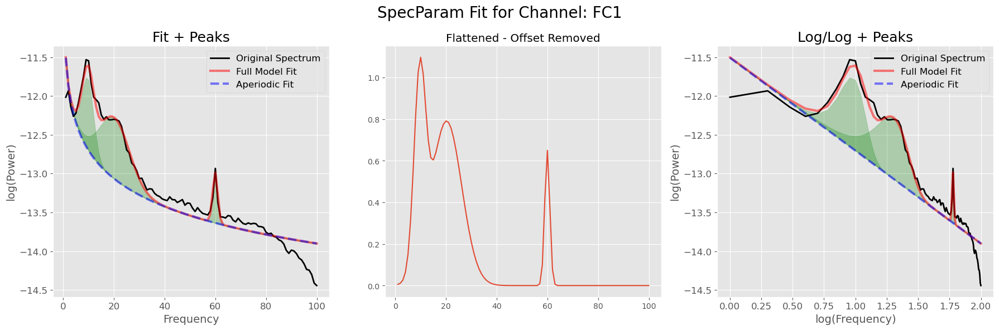

SpecParam for Channel: C3
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -12.0328, 1.0221                                         
                                                                                                  
                                       3 peaks were found:                         

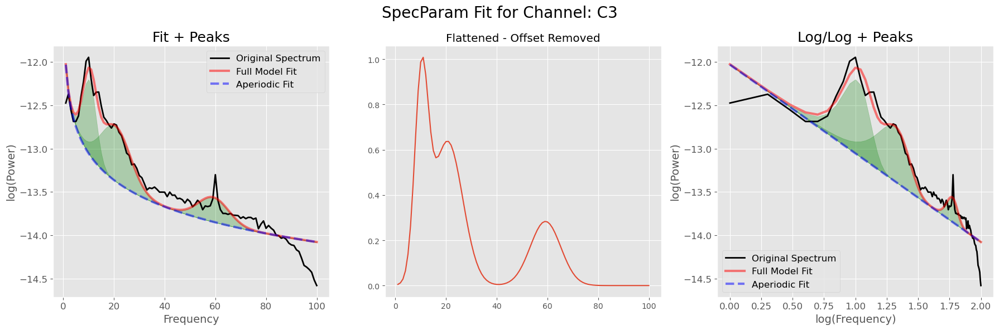

SpecParam for Channel: T7
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -12.0865, 0.8495                                         
                                                                                                  
                                       3 peaks were found:                         

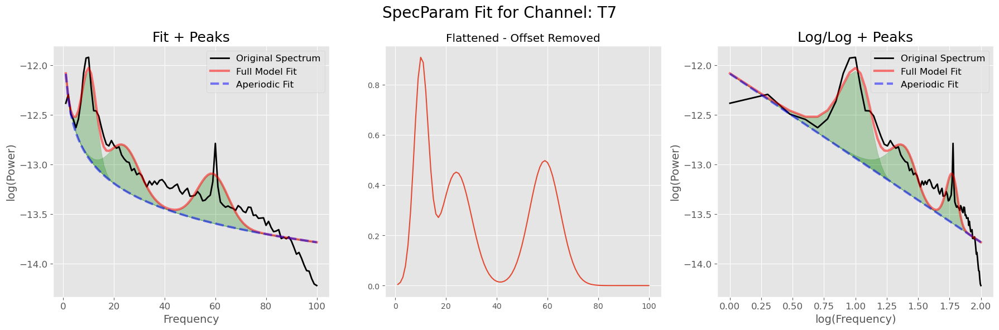

SpecParam for Channel: TP9
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.4604, 0.7801                                         
                                                                                                  
                                       2 peaks were found:                        

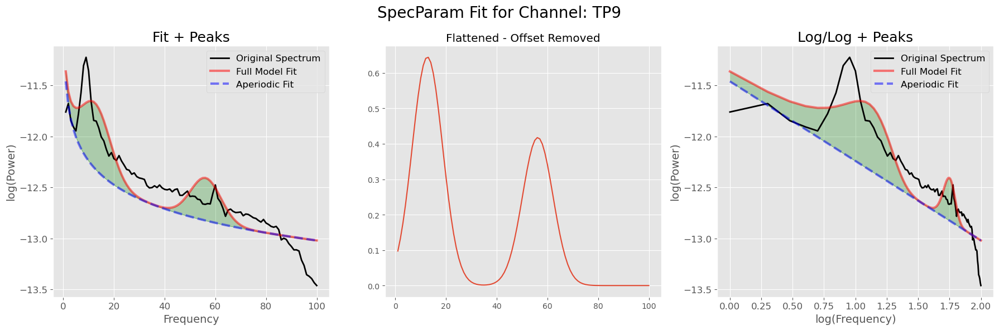

SpecParam for Channel: CP5
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.9969, 0.8810                                         
                                                                                                  
                                       4 peaks were found:                        

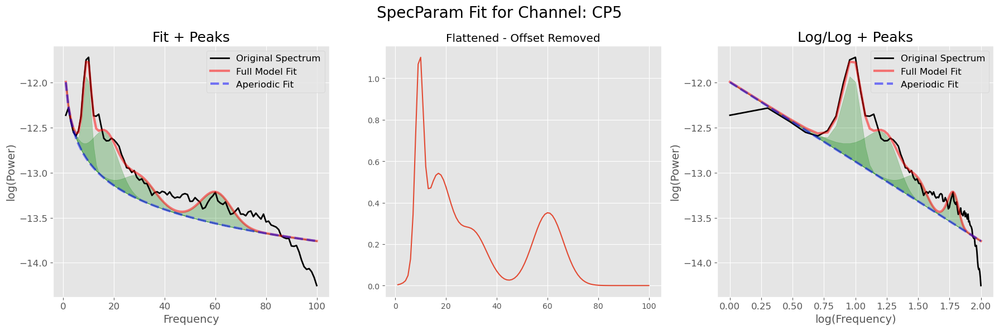

SpecParam for Channel: P7
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.4576, 0.8769                                         
                                                                                                  
                                       3 peaks were found:                         

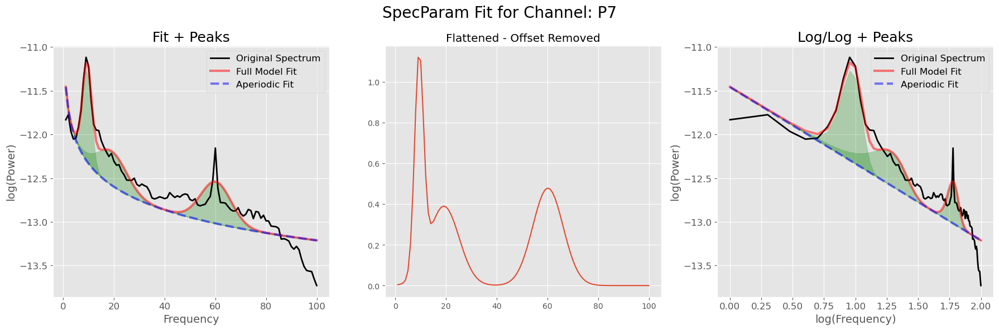

SpecParam for Channel: O1
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.4096, 1.0081                                         
                                                                                                  
                                       3 peaks were found:                         

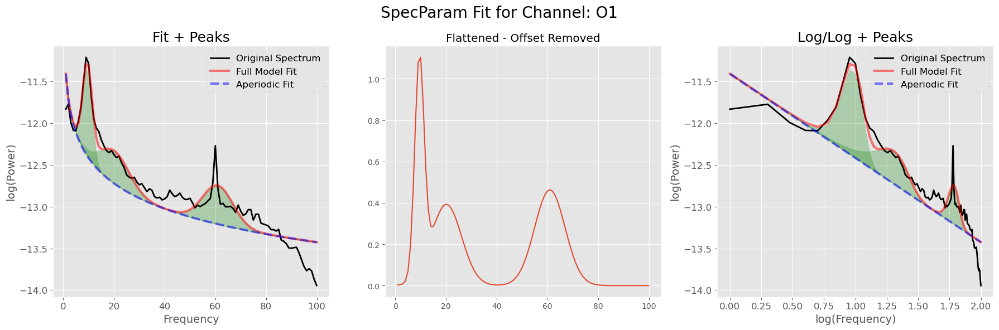

SpecParam for Channel: P4
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.7697, 0.9007                                         
                                                                                                  
                                       3 peaks were found:                         

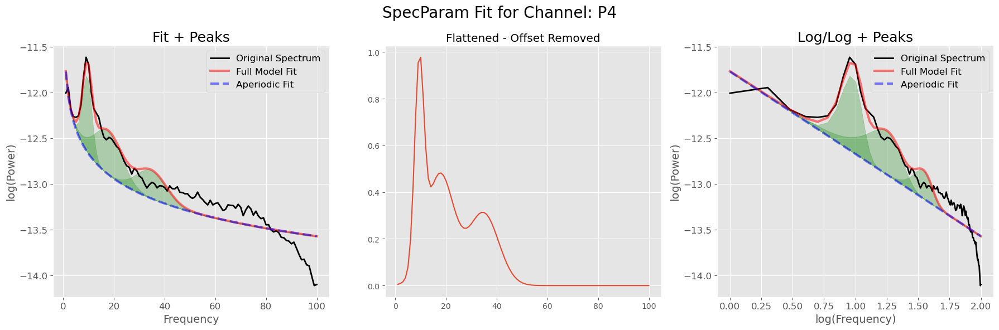

SpecParam for Channel: P8
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.5125, 0.9717                                         
                                                                                                  
                                       3 peaks were found:                         

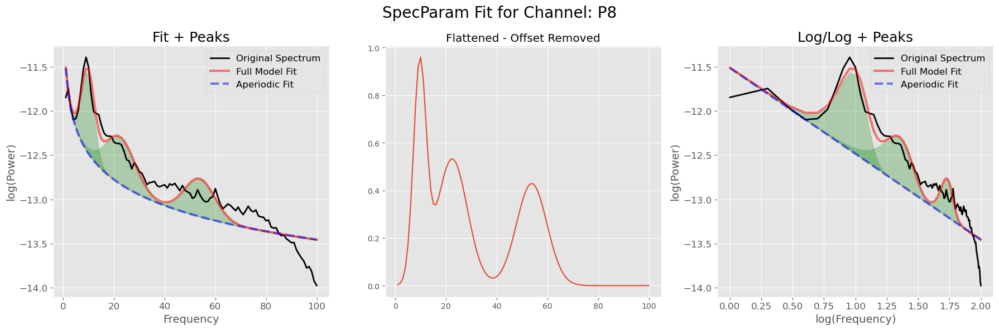

SpecParam for Channel: FT10
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.6627, 0.9702                                         
                                                                                                  
                                       3 peaks were found:                       

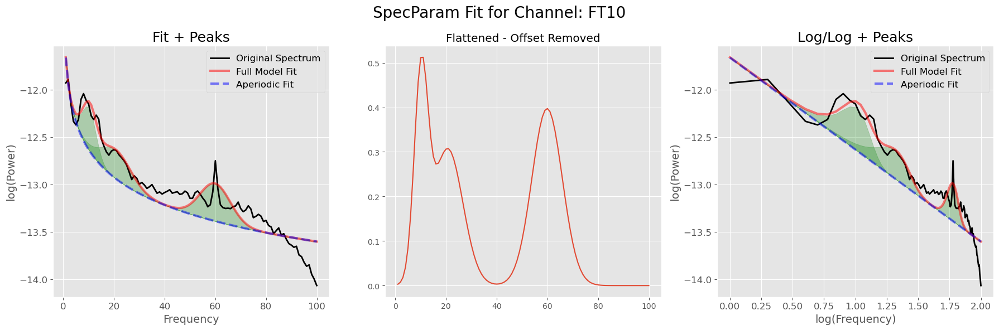

SpecParam for Channel: FC6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -12.2844, 0.8763                                         
                                                                                                  
                                       2 peaks were found:                        

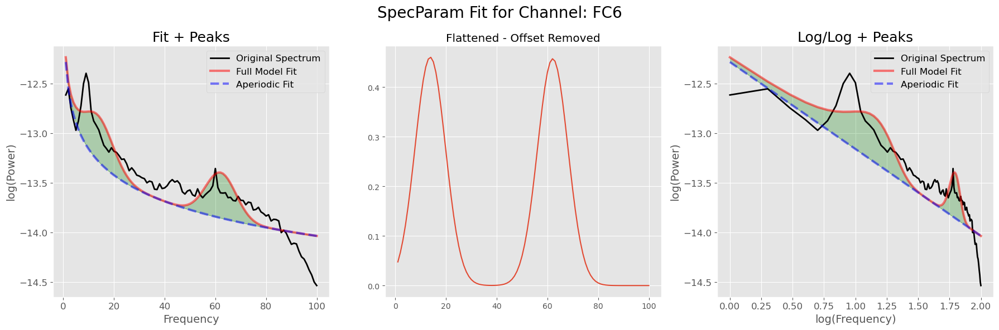

SpecParam for Channel: F4
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.8067, 0.9510                                         
                                                                                                  
                                       2 peaks were found:                         

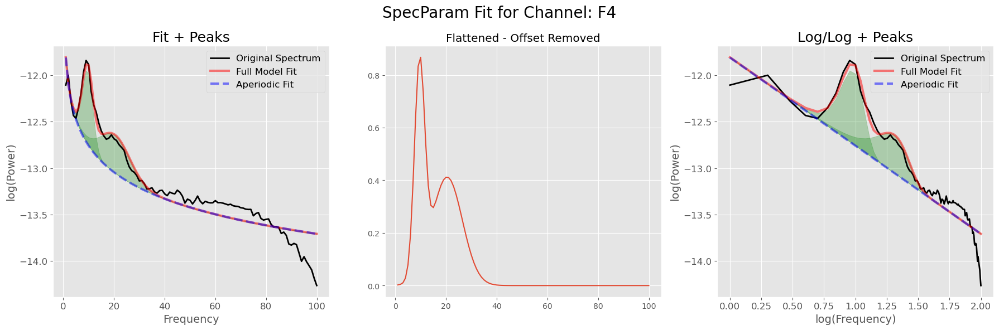

SpecParam for Channel: F8
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.8967, 0.9484                                         
                                                                                                  
                                       3 peaks were found:                         

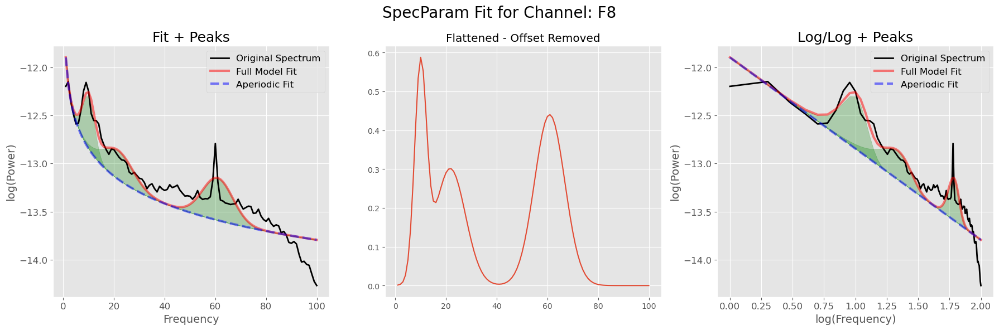

SpecParam for Channel: Fp2
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.7655, 0.9964                                         
                                                                                                  
                                       3 peaks were found:                        

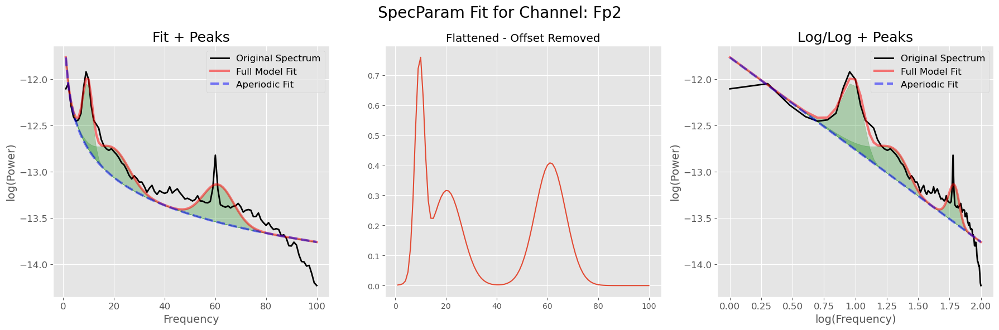

SpecParam for Channel: AFz
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.2608, 0.9693                                         
                                                                                                  
                                       2 peaks were found:                        

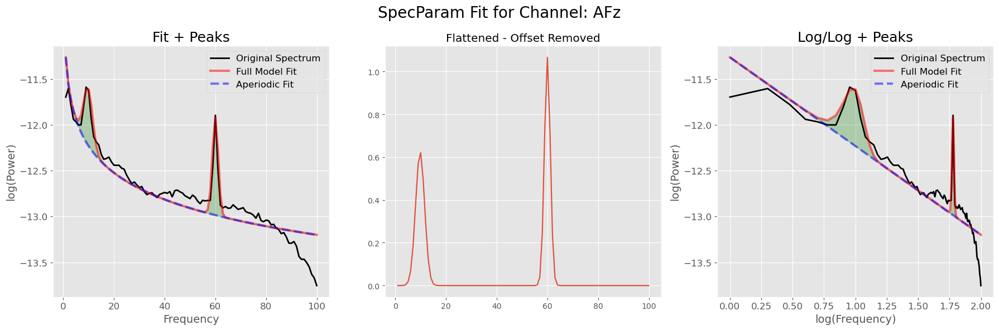

SpecParam for Channel: F1
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.6169, 1.1039                                         
                                                                                                  
                                       2 peaks were found:                         

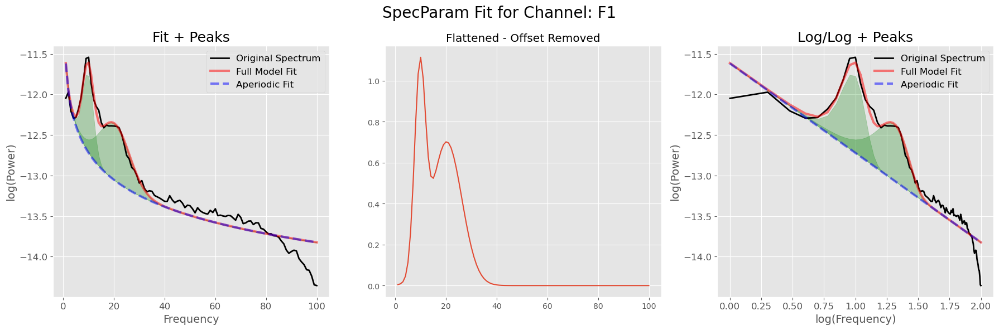

SpecParam for Channel: FT7
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.8451, 0.9810                                         
                                                                                                  
                                       2 peaks were found:                        

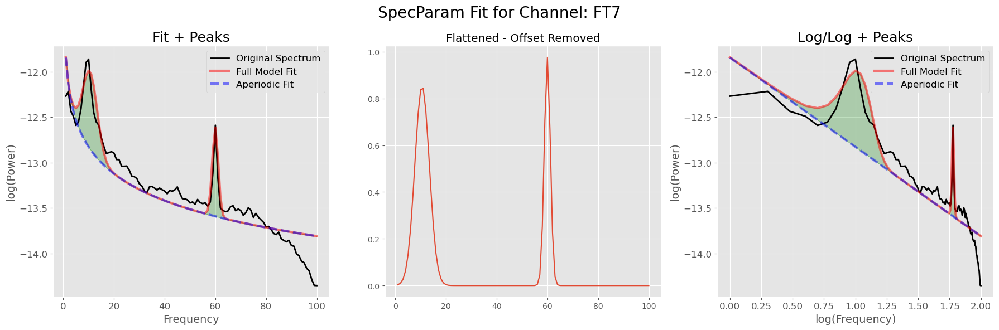

SpecParam for Channel: FC3
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.7806, 1.1047                                         
                                                                                                  
                                       2 peaks were found:                        

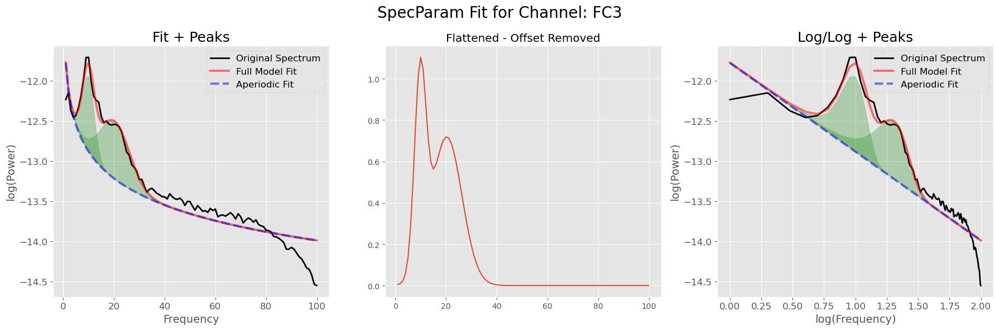

SpecParam for Channel: C5
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -12.1201, 0.8500                                         
                                                                                                  
                                       3 peaks were found:                         

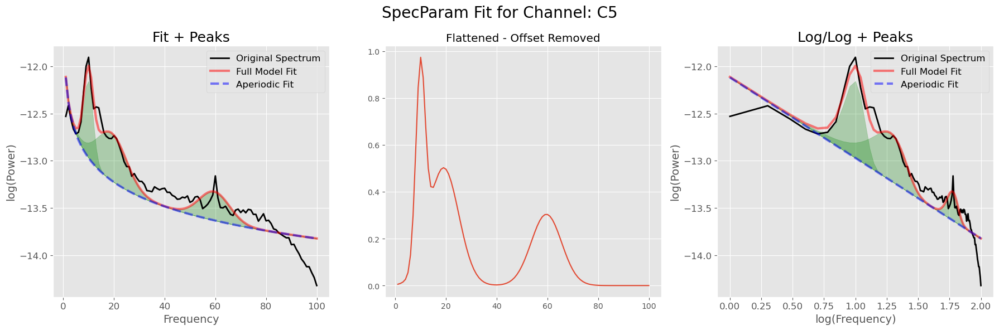

SpecParam for Channel: TP7
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.7929, 0.8433                                         
                                                                                                  
                                       4 peaks were found:                        

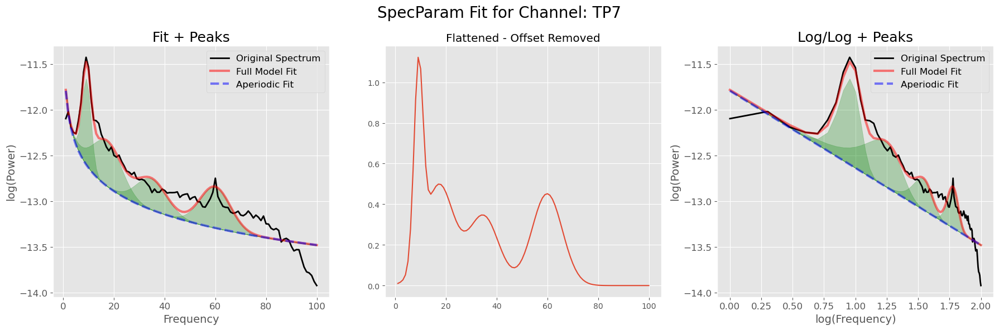

SpecParam for Channel: CP3
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.8826, 0.9979                                         
                                                                                                  
                                       2 peaks were found:                        

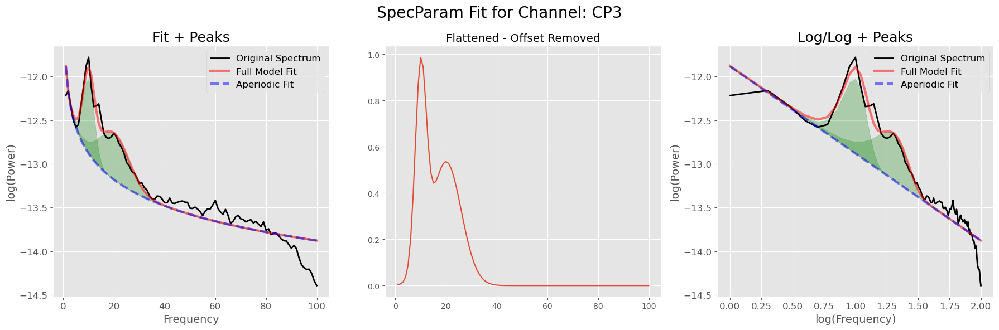

SpecParam for Channel: P5
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.6179, 0.9523                                         
                                                                                                  
                                       4 peaks were found:                         

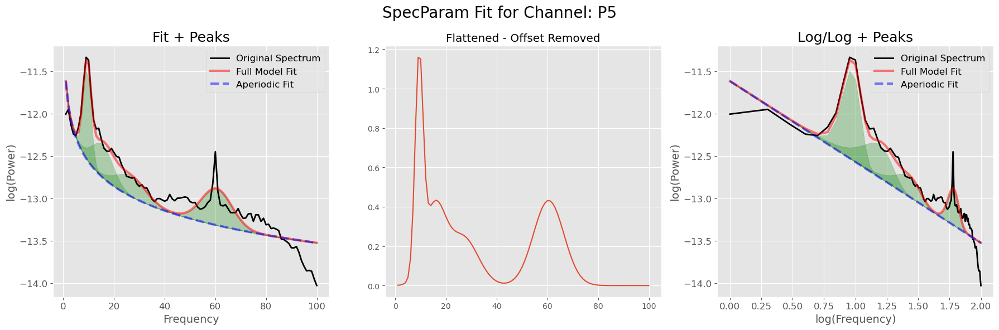

SpecParam for Channel: PO7
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.4095, 1.0037                                         
                                                                                                  
                                       3 peaks were found:                        

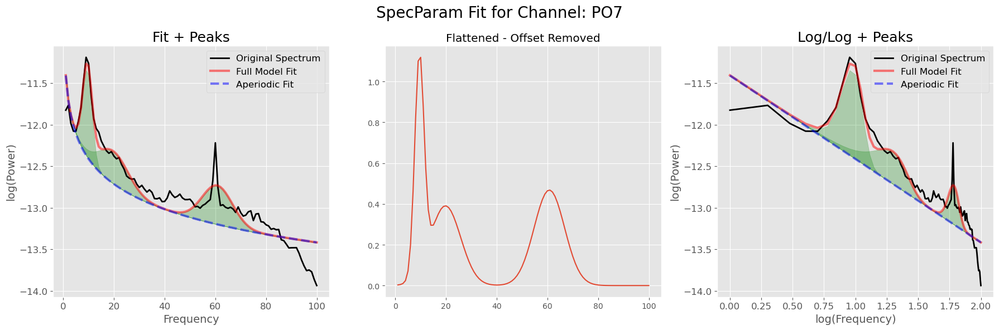

SpecParam for Channel: PO3
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.4379, 1.0827                                         
                                                                                                  
                                       3 peaks were found:                        

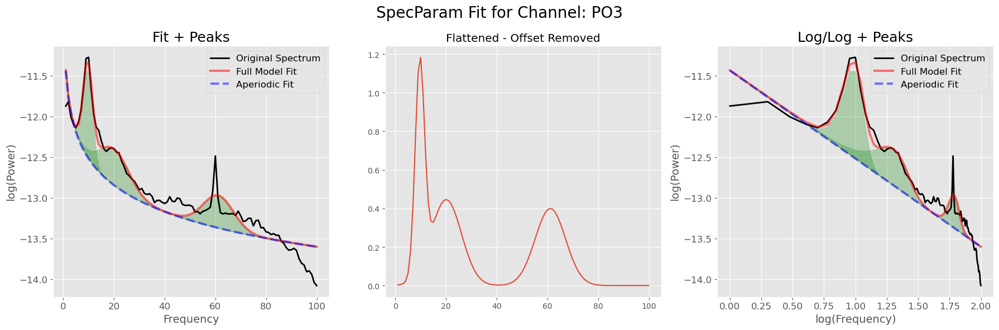

SpecParam for Channel: POz
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.5367, 0.9464                                         
                                                                                                  
                                       2 peaks were found:                        

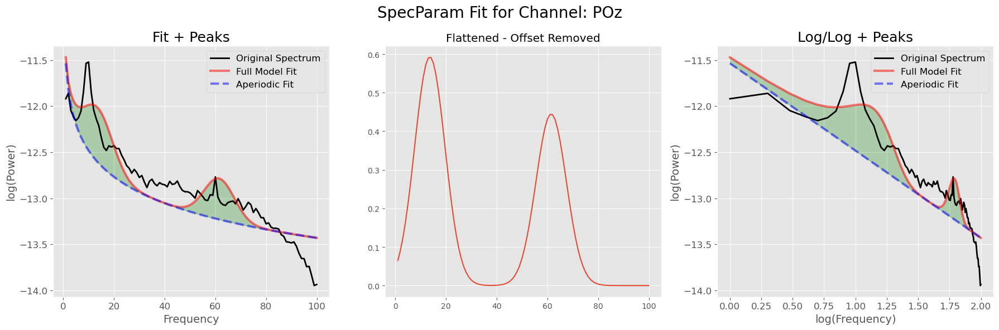

SpecParam for Channel: P6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.7394, 0.8688                                         
                                                                                                  
                                       3 peaks were found:                         

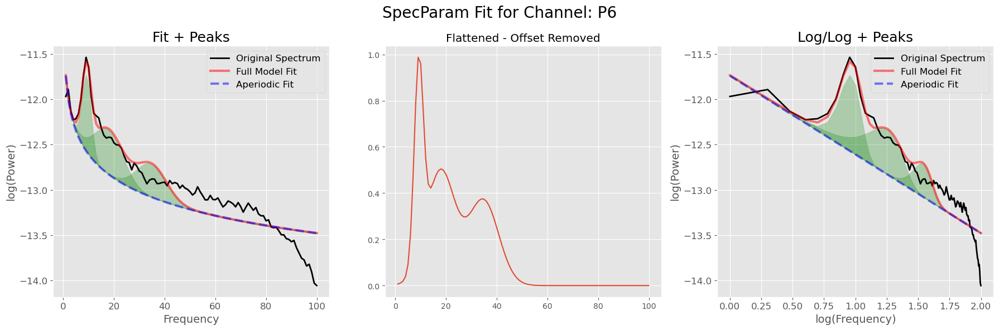

SpecParam for Channel: C6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -12.1787, 1.0122                                         
                                                                                                  
                                       2 peaks were found:                         

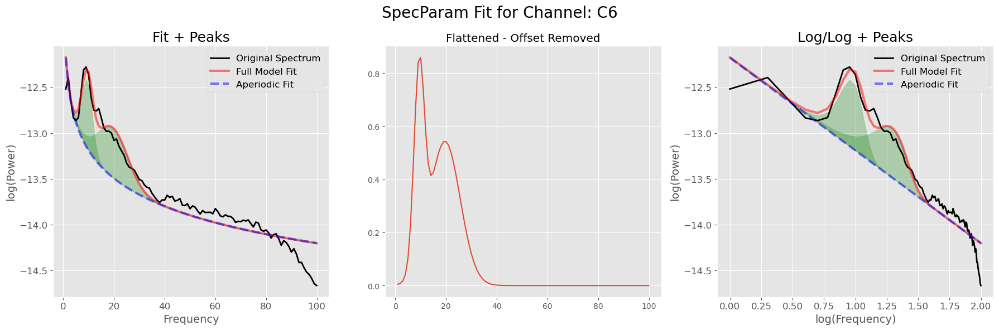

SpecParam for Channel: FT8
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -12.1429, 0.8916                                         
                                                                                                  
                                       3 peaks were found:                        

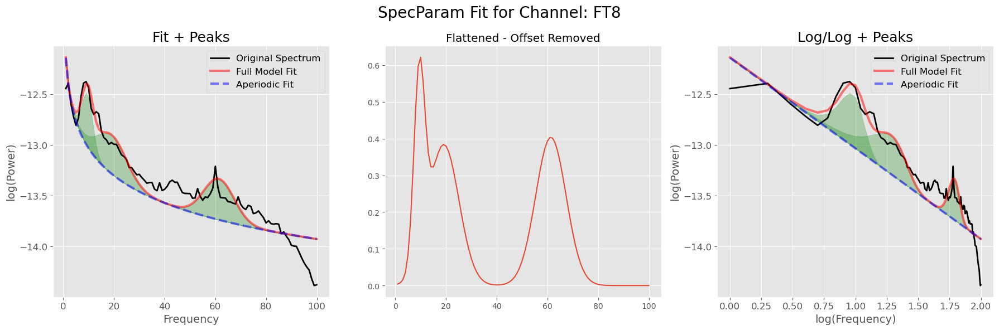

SpecParam for Channel: F6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.8518, 0.9354                                         
                                                                                                  
                                       4 peaks were found:                         

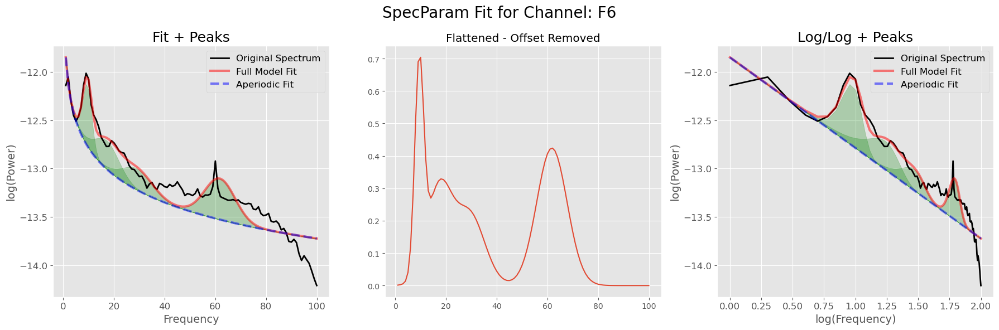

SpecParam for Channel: AF8
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.6622, 1.0175                                         
                                                                                                  
                                       3 peaks were found:                        

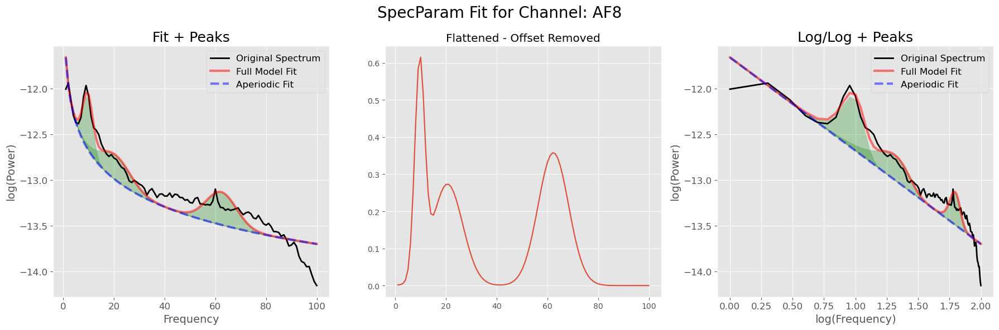

SpecParam for Channel: AF4
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.7862, 0.9800                                         
                                                                                                  
                                       2 peaks were found:                        

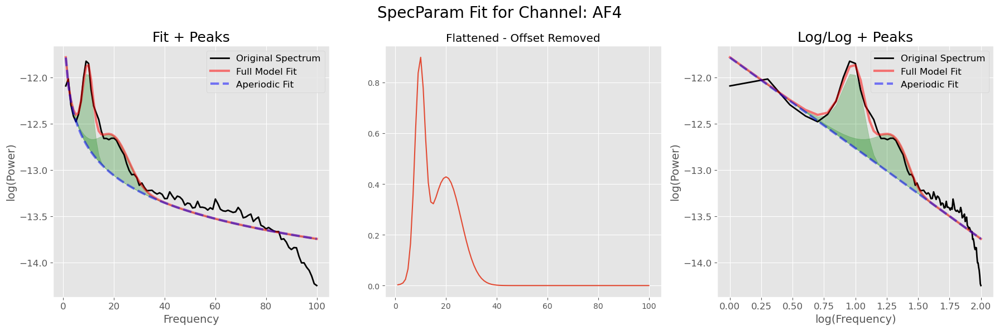

SpecParam for Channel: FCz
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.5597, 1.1911                                         
                                                                                                  
                                       3 peaks were found:                        

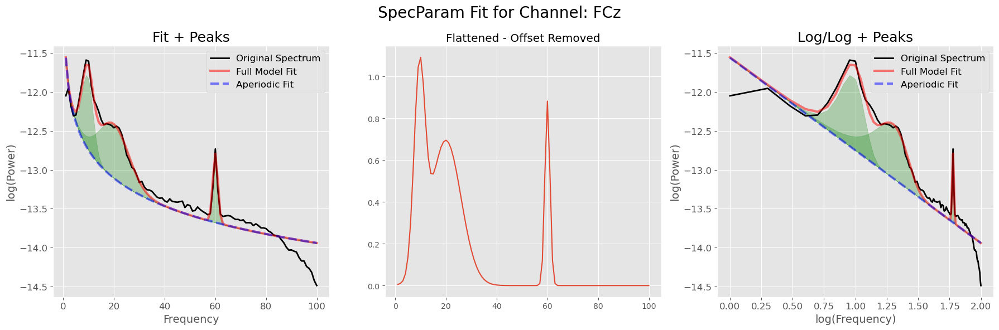

SpecParam for Channel: F4
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.8067, 0.9510                                         
                                                                                                  
                                       2 peaks were found:                         

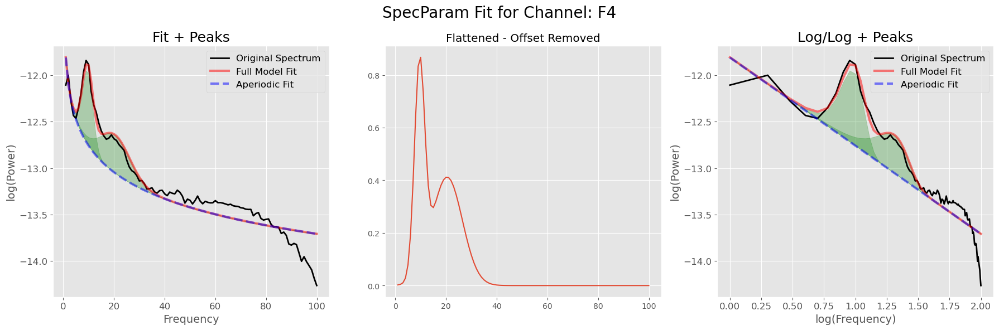

For Channel: F4 Bands: 
[('Delta', array([nan, nan, nan])), ('Theta', array([nan, nan, nan])), ('Alpha', array([9.55366509, 0.86715828, 4.05864643])), ('Beta', array([20.41569554,  0.41160161, 11.99999858])), ('Gamma', array([nan, nan, nan]))]
SpecParam for Channel: C5
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                     

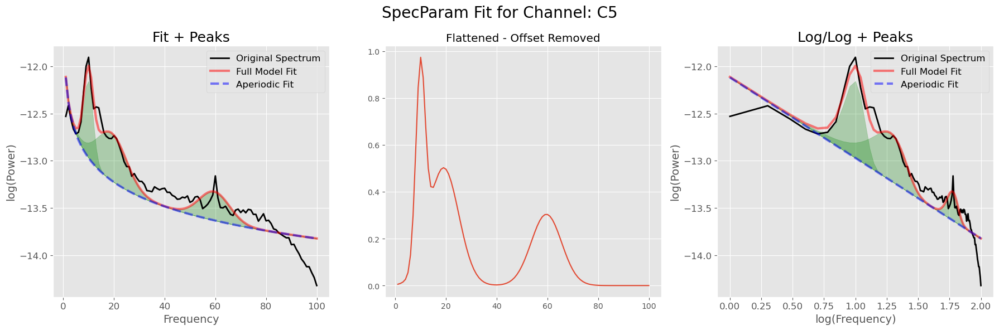

For Channel: C5 Bands: 
[('Delta', array([nan, nan, nan])), ('Theta', array([nan, nan, nan])), ('Alpha', array([9.90739588, 0.97313658, 3.66901236])), ('Beta', array([19.01986933,  0.50246111, 12.        ])), ('Gamma', array([59.58392009,  0.30317277, 12.        ]))]
SpecParam for Channel: Cz
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
             

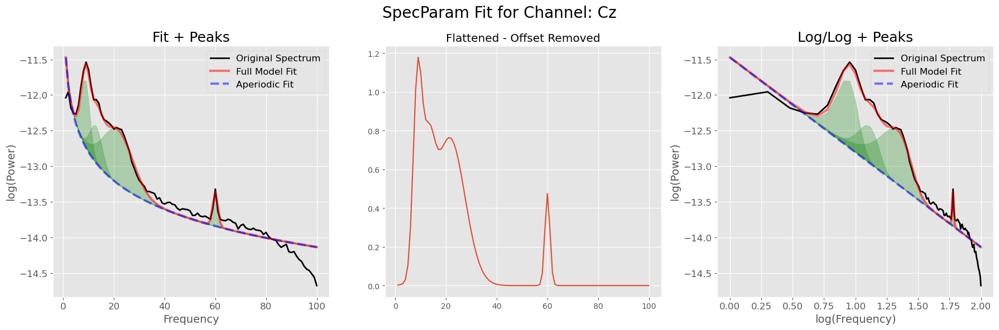

For Channel: Cz Bands: 
[('Delta', array([nan, nan, nan])), ('Theta', array([nan, nan, nan])), ('Alpha', array([[ 8.71350964,  1.17873753,  3.40072507],
       [12.86827623,  0.84262934,  4.85883894]])), ('Beta', array([21.44246588,  0.76354056, 11.99992278])), ('Gamma', array([59.99995042,  0.47525182,  2.        ]))]
SpecParam for Channel: P6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, e

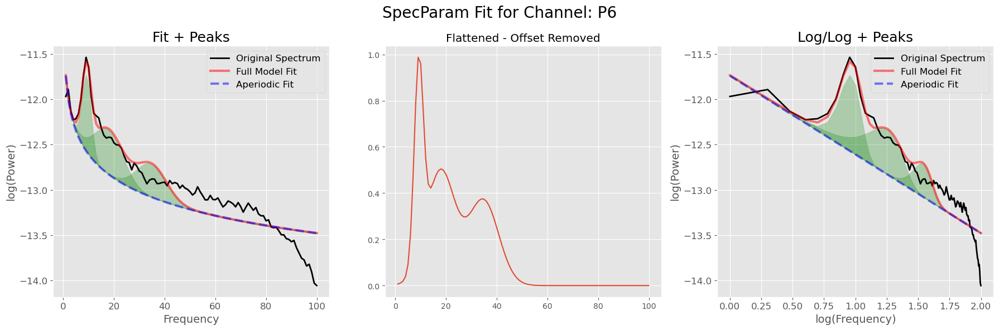

For Channel: P6 Bands: 
[('Delta', array([nan, nan, nan])), ('Theta', array([nan, nan, nan])), ('Alpha', array([9.22257242, 0.98738528, 3.571358  ])), ('Beta', array([17.82433127,  0.50465075, 11.41298801])), ('Gamma', array([34.73976864,  0.37359691, 11.99999986]))]
---Collating Results for sub-006 ------------------------------

-----------------------------------------------------------------------------------------------
Subject: sub-102
---Get EEG Preprocessed Data - FIF ----------------------------------
Reading /Users/stuartgow/GitHub/EEG_ML_Pipeline/Data/Study_IOWA_Rest/1_EEG_Processing_Results/1a_EEG_Preprocessing_Results_20250702_full_run/EEG_2_cleaned_files/sub-102_preprocessed_epo.fif ...
    Found the data of interest:
        t =       0.00 ...     998.00 ms
        0 CTF compensation matrices available
Not setting metadata
203 matching events found
No baseline correction applied
0 projection items activated
Description: None on None
<EpochsFIF | 203 events (all good), 0 

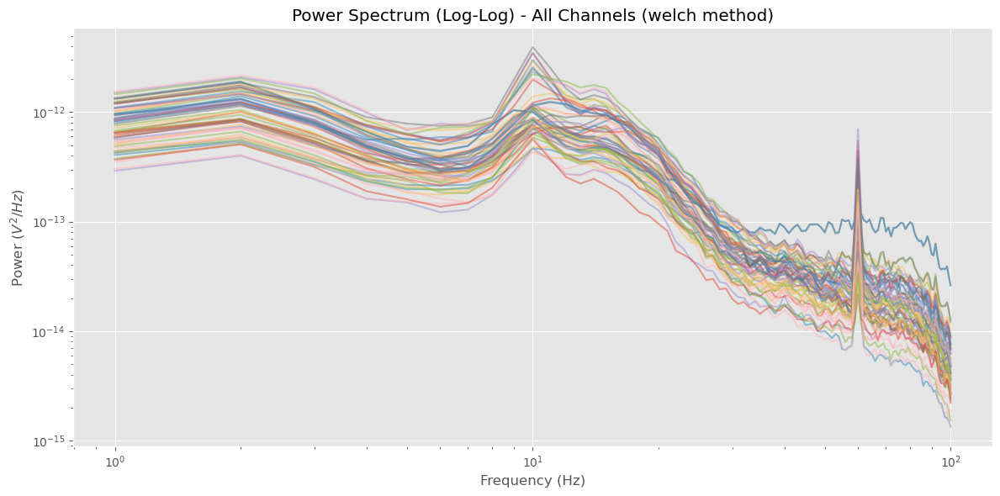

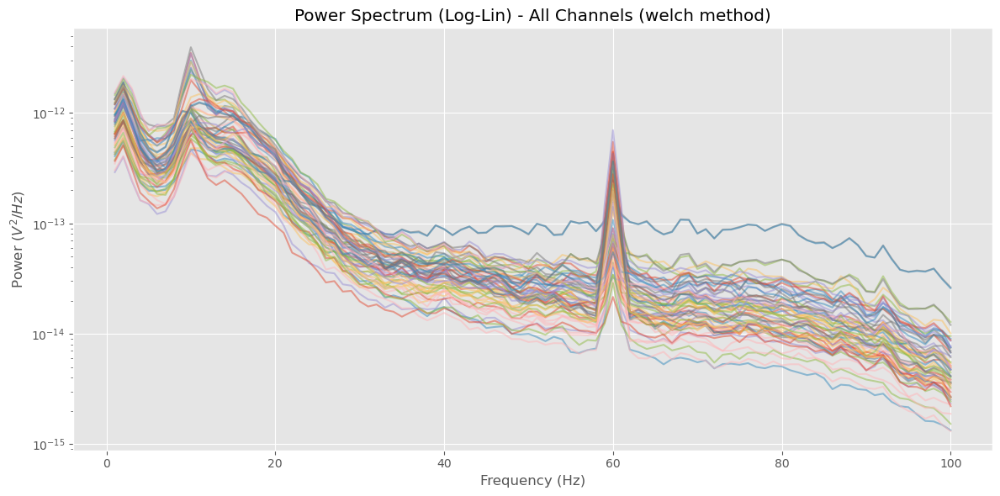

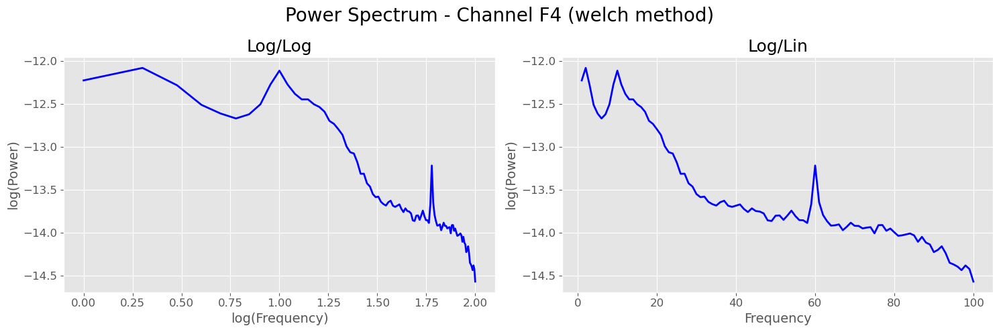

---EEG Spectral Parameterisation------------------------------------
Given: 2.0 & 12 and new 2.0


Running group fits.:   0%|          | 0/63 [00:00<?, ?it/s]

Group Summary: 
SPM_fit_quality_warning                        True
spectra_count                                    63
null_fits                                         0
error_mean                                 0.074026
r2_mean                                    0.972108
flagged_channels           [16, 17, 47, 49, 50, 62]
peaks_count_max                                  10
peaks_count_mean                           3.619048
dtype: object
                                                                                                  
                                          GROUP RESULTS                                           
                                                                                                  
                             Number of power spectra in the Group: 63                             
                                                                                                  
                       The model was run on the frequency r

/var/folders/wd/rhzj_w8570g_y66t6j6mh4zw0000gn/T/ipykernel_26827/2646068876.py:83: UserWarning: SpecParam Fit Issues
  warnings.warn(f'SpecParam Fit Issues', UserWarning)


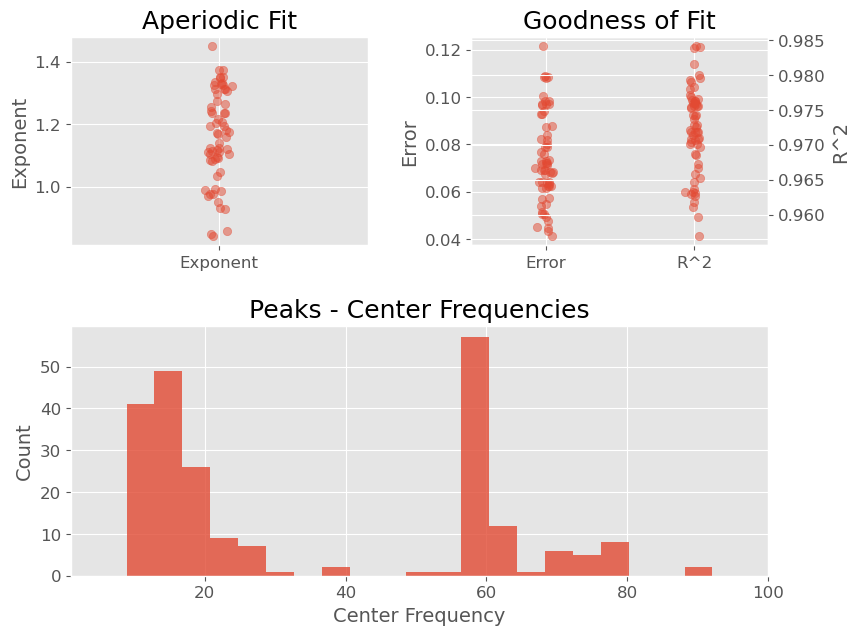

SpecParam for Channel: O2
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.2630, 1.3057                                         
                                                                                                  
                                       1 peaks were found:                         

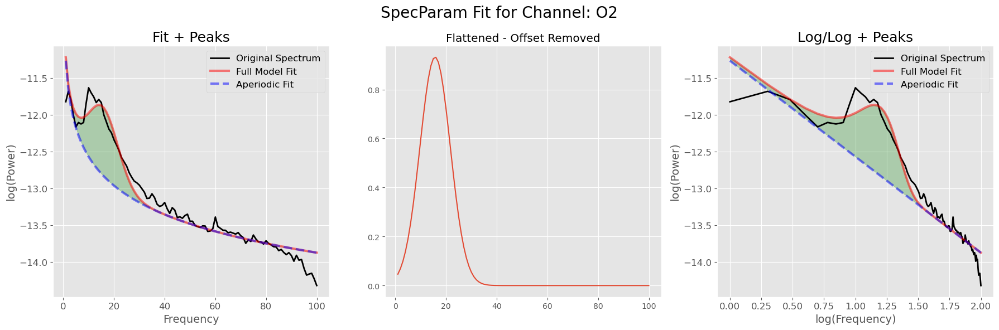

SpecParam for Channel: P4
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.5020, 1.3358                                         
                                                                                                  
                                       2 peaks were found:                         

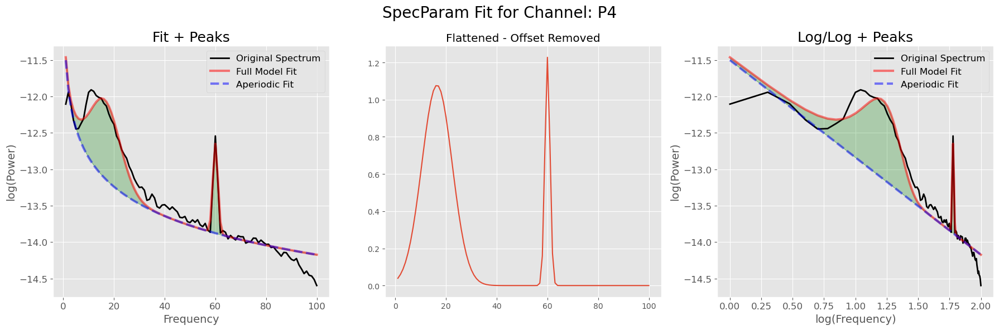

SpecParam for Channel: PO4
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.2184, 1.3745                                         
                                                                                                  
                                       2 peaks were found:                        

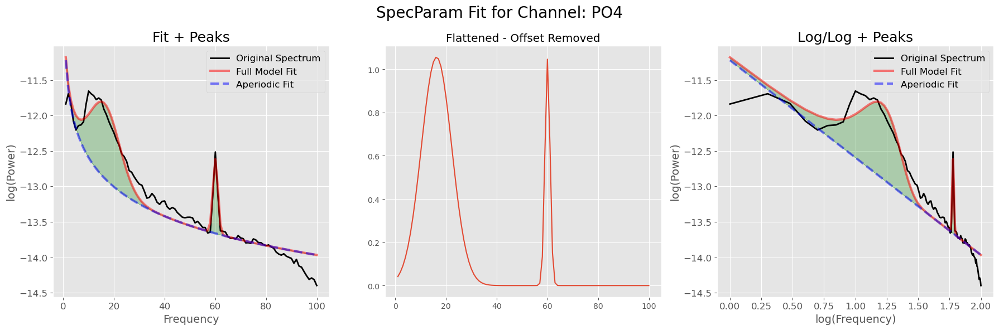

SpecParam for Channel: P6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.4855, 1.3293                                         
                                                                                                  
                                       2 peaks were found:                         

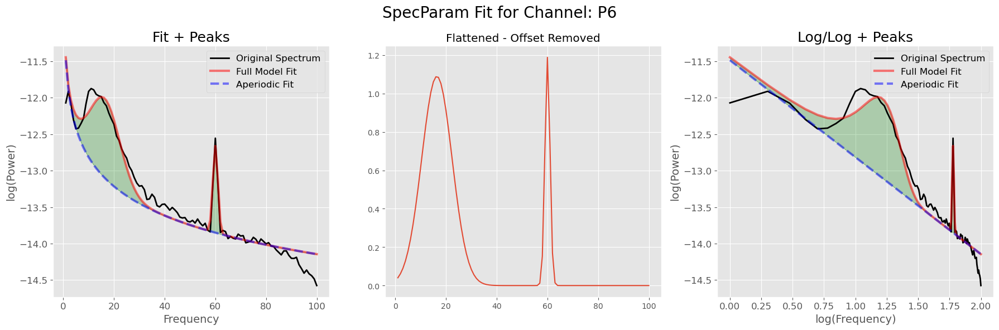

SpecParam for Channel: P2
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.4882, 1.3316                                         
                                                                                                  
                                       2 peaks were found:                         

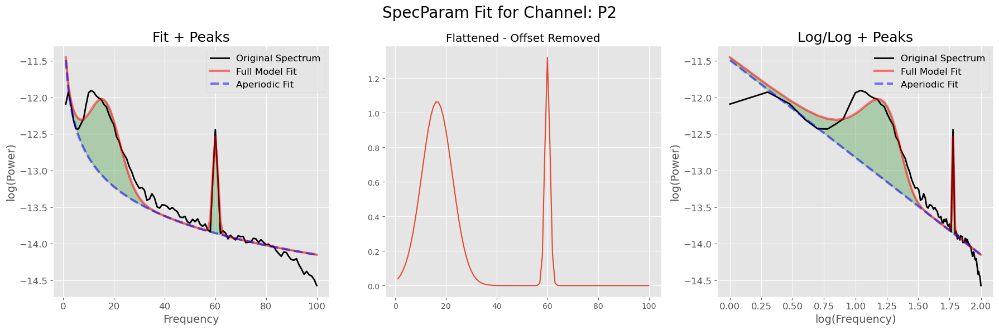

SpecParam for Channel: FCz
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.6860, 1.3262                                         
                                                                                                  
                                       2 peaks were found:                        

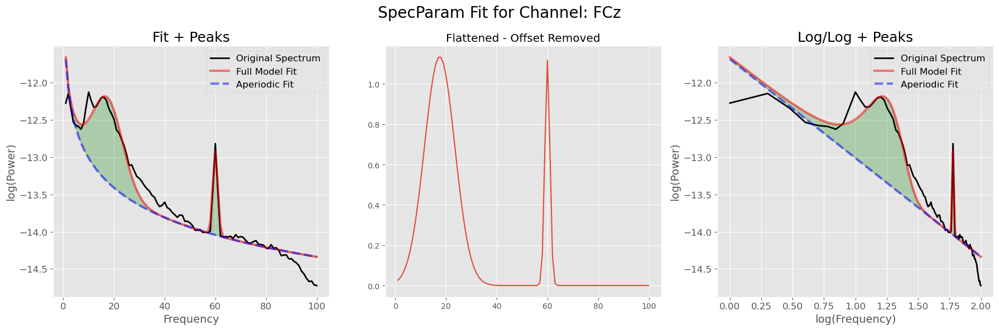

SpecParam for Channel: F4
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.8316, 1.1753                                         
                                                                                                  
                                       4 peaks were found:                         

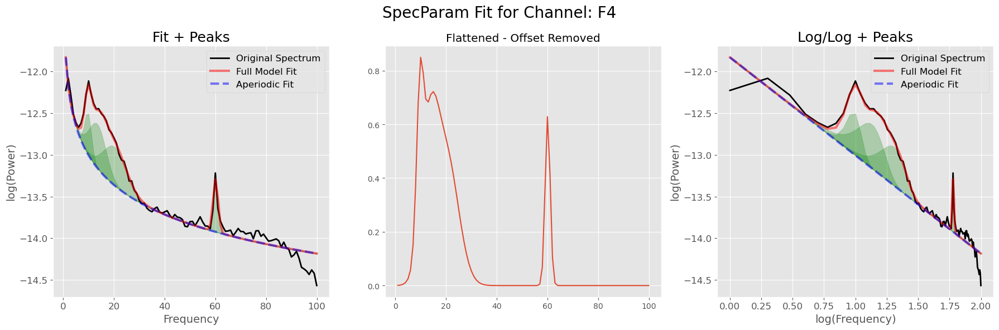

For Channel: F4 Bands: 
[('Delta', array([nan, nan, nan])), ('Theta', array([nan, nan, nan])), ('Alpha', array([9.74355156, 0.84964973, 2.66374704])), ('Beta', array([[13.51438873,  0.71132815,  6.75213666],
       [20.34969916,  0.54824762,  9.30758215]])), ('Gamma', array([60.10051424,  0.62855576,  2.        ]))]
SpecParam for Channel: C5
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, expo

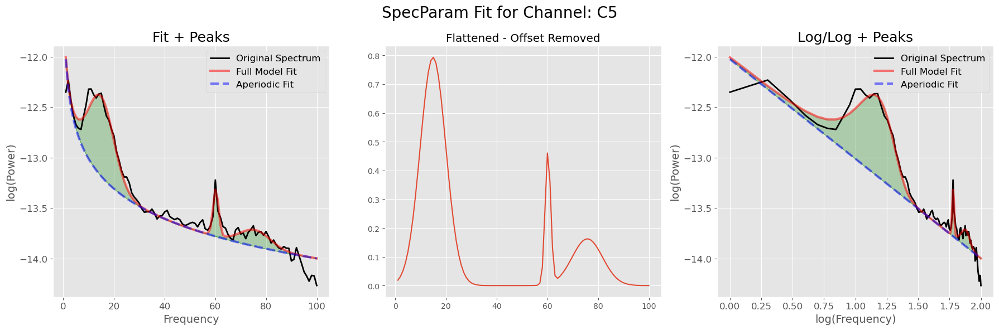

For Channel: C5 Bands: 
[('Delta', array([nan, nan, nan])), ('Theta', array([nan, nan, nan])), ('Alpha', array([nan, nan, nan])), ('Beta', array([14.87830688,  0.79324106, 10.13196953])), ('Gamma', array([[60.20066434,  0.4607554 ,  2.18679808],
       [75.75377544,  0.16227261, 11.99999987]]))]
SpecParam for Channel: Cz
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):               

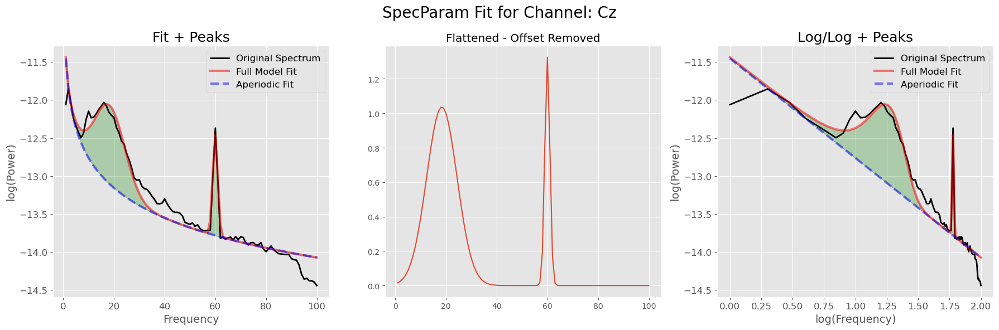

For Channel: Cz Bands: 
[('Delta', array([nan, nan, nan])), ('Theta', array([nan, nan, nan])), ('Alpha', array([nan, nan, nan])), ('Beta', array([18.34853124,  1.03533379, 12.        ])), ('Gamma', array([59.97323604,  1.32514338,  2.00000002]))]
SpecParam for Channel: P6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was run on the frequency range 1 - 100 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                  

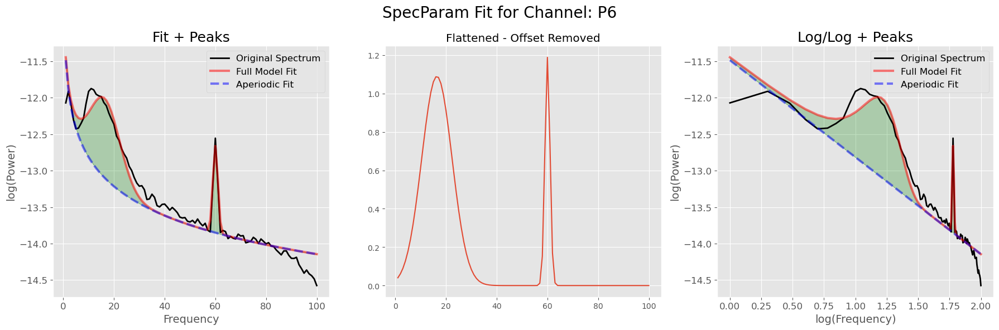

For Channel: P6 Bands: 
[('Delta', array([nan, nan, nan])), ('Theta', array([nan, nan, nan])), ('Alpha', array([nan, nan, nan])), ('Beta', array([16.40046025,  1.08704811, 12.        ])), ('Gamma', array([60.02478231,  1.18844172,  2.        ]))]
---Collating Results for sub-102 ------------------------------


In [ ]:
# Run all the steps for EEG feature extraction
#

# Start Trace
summary = f'EEG Feature Extraction'
summary = summary + f"\n- Study: {study_info['study_name']} {study_info['dataset_ref']}"
summary = summary + f"\n- Run: {run_details['run_name']}"
summary = summary + f"\n- Data Source: {run_details['data_source']}"
summary = summary + f"\n- PSD Params: {psd_params}"
summary = summary + f"\n- SpecParam Params: {specparam_params}"
print(summary)

# Loop through all selected subjects in the study
for idx, subject in study_subjects_df.iterrows():

    # Just sample a subset of subjects when in test mode
    if test_mode and idx not in test_subjects:
        continue

    subject_id = subject['subject_id']
    print('\n-----------------------------------------------------------------------------------------------')
    print(f'Subject: {subject_id}')

    # 1. EEG Preprosessed Data Load
    #
    print('---Get EEG Preprocessed Data - FIF ----------------------------------')
    source_file_path = utils.get_file_path(source_data_path, f"{subject['subject_id']}_preprocessed_epo.fif")
    EEG_preprocessed = mne.read_epochs(source_file_path, preload=True, verbose=VERBOSE)
    preprocessing_results = pd.read_pickle(source_data_path + f'/{subject_id}_preprocessing_results.pkl', compression='zip')

    if VERBOSE:
        print(f"Description: {EEG_preprocessed.info['description']} on {EEG_preprocessed.info['meas_date']}")
        print(EEG_preprocessed)
        print(EEG_preprocessed.info)
        # plot_EEG_TD(EEG_preprocessed, test_channels)

    # 2. Power Spectra
    #
    print('---Power Spectra----------------------------------------------------')
    # NB: PSD defaults to Welch for continuous, Multitaper for epoched data, here will typically force to Welch
    psd = EEG_preprocessed.compute_psd(method=psd_params['method'],
                                      fmin=psd_params['fmin'],
                                      fmax=psd_params['fmax'], exclude=psd_params['exclude'])
    
    if VERBOSE:
        print(psd)
        print(psd.info)
        plot_EEG_PSD(psd, test_channels[0])

    # 3. Spectral Parameterisation
    #
    print('---EEG Spectral Parameterisation------------------------------------')
    # Get powers and frequency
    freqs = psd.freqs
    powers = psd.get_data(return_freqs=False)

    # Ensure lower bound limit is > 2 * sampling frequency
    lower, upper = specparam_params['peak_width_limits']
    new_lower = 4 * (EEG_preprocessed.info['sfreq'] / 1000)
    print(f'Given: {lower} & {upper} and new {new_lower}')
    specparam_params['peak_width_limits'][0] = new_lower if lower < new_lower else lower

    # if Epoched then average powers
    # TODO: Does averaging lose information?
    if powers.ndim == 3:  # shape: (n_epochs, n_channels, n_freqs)
        powers = np.mean(powers, axis=0)  # shape: (n_channels, n_freqs)

    # Initialise SpecParam Group Model & fit it
    progress_flag = 'tqdm.notebook' if VERBOSE else None
    fg = SpectralGroupModel(peak_width_limits=specparam_params['peak_width_limits'], 
                                max_n_peaks=specparam_params['max_n_peaks'], 
                                min_peak_height=specparam_params['min_peak_height'],
                                peak_threshold=specparam_params['peak_threshold'],
                                aperiodic_mode=specparam_params['aperiodic_mode'])
    fg.fit(freqs, powers, specparam_params['fit_window'], progress=progress_flag, n_jobs=-1)
    specparam_df = fg.to_df(specparam_params['max_n_peaks']) 

    # Inspect the group fit
    group_summary = inspect_spm_group(fg, 
                                      error_threshold=specparam_params['fit_error_threshold'], 
                                      r2_threshold=specparam_params['fit_r2_threshold'])
    if group_summary['SPM_fit_quality_warning']:
        warnings.warn(f'SpecParam Fit Issues', UserWarning)

    if VERBOSE:
        # print(f'Executed Settings: {fg.get_settings()}')
        
        # Overall group results
        print(f'Group Summary: \n{group_summary}')
        fg.print_results()
        fg.plot()
        plt.show()

        # Plot flagged channels
        for channel_idx in group_summary['flagged_channels']:
            channel_name = psd.ch_names[channel_idx]
            fm = fg.get_model(ind=channel_idx, regenerate=True)
            plot_spm_fit(fm, channel_name)

        # Plot test channels
        for channel_name in test_channels:
            channel_idx = psd.ch_names.index(channel_name)
            fm = fg.get_model(ind=channel_idx, regenerate=True)
            plot_spm_fit(fm, channel_name)
            test_get_bands(fm, channel_name)
    
    # 4. Subject Results
    #
    print(f'---Collating Results for {subject_id} ------------------------------')

    subject_results = pd.concat([subject, preprocessing_results, group_summary])
    # Flatten all the channels
    for idx, row in specparam_df.iterrows():
        row_series = pd.Series(row.values, index=[f'chn_{idx}_{col}' for col in row.index])
        subject_results = pd.concat([subject_results, row_series])
    
    # Append subject_results
    eeg_results_superset_df = pd.concat(
        [eeg_results_superset_df, subject_results.to_frame().T],
        ignore_index=True
    )
    
# Save all results, need to convert datatypes from generic dtype object
eeg_results_superset_df = eeg_results_superset_df.convert_dtypes()
eeg_results_superset_df.to_pickle(run_results_path + '/eeg_results_superset_df.pkl', compression='zip')


# xxxxx

In [14]:
from specparam import Bands
from specparam.data.periodic import get_band_peak, get_band_peak_group

bands = Bands({'Delta': [0.5, 4],
               'Theta': [4, 8],
               'Alpha': [8, 13],
               'Beta': [13, 30],
               'Gamma': [30, 100]
               })

deltas = get_band_peak_group(fg, bands.Delta)
thetas = get_band_peak_group(fg, bands.Theta)
alphas = get_band_peak_group(fg, bands.Alpha)
betas = get_band_peak_group(fg, bands.Beta)
gammas = get_band_peak_group(fg, bands.Gamma)



In [11]:
# # Plot test channels - Bands

# from specparam import Bands
# from specparam.data.periodic import get_band_peak, get_band_peak_group

# bands = Bands({'Delta': [0.5, 4],
#                'Theta': [4, 8],
#                'Alpha': [8, 13],
#                'Beta': [13, 30],
#                'Gamma': [30, 100]
#                })

# for channel_name in ['F4']:
#     channel_idx = psd.ch_names.index(channel_name)
#     fm = fg.get_model(ind=channel_idx, regenerate=True)

#     all_bands = []
#     for band_label in bands.labels:
#         band_range = bands[band_label]
#         peak_details = (band_label, get_band_peak(fm, band_range, select_highest=False))
#         print(peak_details)
        
#         # Ensure peak_details[1] is always a 2D array (n_peaks, 3)
#         # peak_arr = np.atleast_2d(peak_details[1])
#         # peak_details = (peak_details[0], peak_arr)
#         # all_bands.append(peak_details)
#     # plot_spm_fit_withbands(fm, channel_name, all_bands)
#     # print(all_bands)

#     # alpha_peak_max = get_band_peak(fm, bands['Alpha'], select_highest=True)

#     # # Get the label for the alpha band
#     # alpha_label = [label for label in bands.labels if bands[label] == bands['Alpha']][0]
#     # print(f"Band label for bands['Alpha']: {alpha_label}")

#     # plot_spm_fit_withbands(fm, channel_name, alpha_peak_max[0] )
#     # print(alpha_peak_max)




In [12]:
def check_nans(data, nan_policy='zero'):
    """Check an array for nan values, and replace, based on policy."""

    # Find where there are nan values in the data
    nan_inds = np.where(np.isnan(data))

    # Apply desired nan policy to data
    if nan_policy == 'zero':
        data[nan_inds] = 0
    elif nan_policy == 'mean':
        data[nan_inds] = np.nanmean(data)
    else:
        raise ValueError('Nan policy not understood.')

    return data

In [13]:
# Function to plot a SpecParam Fit - With Bands
#

def plot_spm_fit_withbands(fm, channel_name, all_bands):

    print(f'SpecParam for Channel: {channel_name}')
    fm.print_results()

    freqs = fm.freqs
    flattened_data = fm.get_model(component='peak', space='log')

    # Three plots
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
    fig.suptitle(f'SpecParam Fit for Channel: {channel_name}', fontsize=20)
    axes[0].set_title('Fit + Peaks')
    fm.plot(plot_peaks='shade', peak_kwargs={'color' : 'green'}, ax=axes[0])

    print(all_bands)
    # for band_label, band_peak in all_bands:
    #     if band_peak is not None and not np.isnan(band_peak[0]):
    #         # axes[0].axvline(x=band_peak[0], color='skyblue', linestyle='--', linewidth=1.5, label=band_label)
    #         # axes[0].axvline(x=band_peak[0], color=plt.cm.tab10(bands.labels.index(band_label)), linestyle='--', linewidth=2, label=band_label)
    #         color = plt.get_cmap('tab10')(bands.labels.index(band_label))
    #         axes[0].axvline(x=band_peak[0], color=color, linestyle='--', linewidth=2, label=band_label)
    #         axes[0].legend()
    # handles, labels = axes[0].get_legend_handles_labels()
    # by_label = dict(zip(labels, handles))
    # axes[0].legend(by_label.values(), by_label.keys())

    for band_label, band_peak in all_bands:
        for peak in band_peak:
            print(band_label, peak)


        #     # Handle if band_peak is an array of multiple peaks (shape (N, 3))
        # if isinstance(band_peak, np.ndarray) and band_peak.ndim == 2:
        #     for peak in band_peak:
        #     if peak is not None and not np.isnan(peak[0]):
        #         color = plt.get_cmap('tab10')(bands.labels.index(band_label))
        #         axes[0].axvline(x=peak[0], color=color, linestyle='--', linewidth=2, label=band_label)
        #     axes[0].legend()
        #     continue


    axes[1].set_title('Flattened - Offset Removed')
    axes[1].plot(freqs, flattened_data)
    axes[2].set_title('Log/Log + Peaks')
    fm.plot(plot_peaks='shade', peak_kwargs={'color' : 'green'}, plt_log=True, ax=axes[2])
    plt.show()
    